# Proyek Analisis Data: Air Quality Beijing (2013-2017)

- Nama: Ninditya Salma Nur Aini  
- Email: ninditya.sna025@gmail.com  
- ID Dicoding: ninditya_sna

## Menentukan Pertanyaan Bisnis

1. Pertanyaan Bisnis 1: Pada periode 2013-2017, bagaimana tren perbaikannya dan waktu kritis (jam, hari, bulan, dan tahun) yang perlu menjadi fokus pengawasan polutan?
2. Pertanyaan Bisnis 2: Pada setiap musim dalam periode 2013-2017, faktor meteorologi apa yang paling berkontribusi terhadap peningkatan risiko polusi?
3. Pertanyaan Bisnis 3 (Clustering/Binning AQI Multi-Polutan tanpa ML): Berdasarkan data periode 2013-2017, polutan apa yang menjadi penyebab utama penurunan kualitas udara, dan bagaimana prioritas pengendaliannya berdasarkan tingkat risiko?
4. Pertanyaan Bisnis 4 (Geospasial dan Clustering Manual tanpa ML): Pada periode 2013-2017, area mana yang memerlukan intervensi prioritas berdasarkan tingkat polusi PM2.5 dan gas polutan?


## Import Semua Packages/Library yang Digunakan

In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots
import folium
from scipy import stats

from IPython.display import display

sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (10, 5)
pio.renderers.default = "plotly_mimetype"

# Tema warna soft (global)
SOFT_BLUE = "#5F87A8"
SOFT_PEACH = "#C58F78"
SOFT_GREEN = "#7EAE99"
SOFT_ROSE = "#B889A1"
SOFT_CMAP_HEAT = "GnBu"
SOFT_CMAP_DIV = "coolwarm"

sns.set_theme(style="whitegrid", palette=[SOFT_BLUE, SOFT_PEACH, SOFT_GREEN, SOFT_ROSE])
plt.rcParams["axes.prop_cycle"] = plt.cycler(color=[SOFT_BLUE, SOFT_PEACH, SOFT_GREEN, SOFT_ROSE, "#95ACC6", "#A7C39A"])

soft_template = go.layout.Template()
soft_template.layout.colorway = [SOFT_BLUE, SOFT_PEACH, SOFT_GREEN, SOFT_ROSE, "#95ACC6", "#A7C39A"]
soft_template.layout.paper_bgcolor = "white"
soft_template.layout.plot_bgcolor = "white"
soft_template.layout.font = dict(color="#405060")
pio.templates["soft_beijing"] = soft_template
pio.templates.default = "soft_beijing"





## Data Wrangling

### Gathering Data

Pada tahap ini, data gabungan kualitas udara dan koordinat stasiun dimuat dari folder `data/`.
Tahap ini hanya fokus ke proses pengambilan data (extract), belum masuk ke cleaning.


In [2]:
# 3.Gathering Data (self-contained)

# Robust root detection: notebook bisa dijalankan dari root project atau subfolder
cwd = Path.cwd()
PROJECT_PATH = cwd if (cwd / "data").exists() else cwd.parent
DATA_PATH = PROJECT_PATH / "data"
COMBINED_FILEPATH = DATA_PATH / "air_quality_hourly_all_stations.csv"
COORD_PATH = DATA_PATH / "station_coordinates.csv"

df = pd.read_csv(COMBINED_FILEPATH)

# Load koordinat stasiun
coords = pd.read_csv(COORD_PATH)

df["datetime"] = pd.to_datetime(df["datetime"], errors="coerce")

print("Shape data utama       :", df.shape)
print("Shape data koordinat   :", coords.shape)

display(df.head())
display(coords.head())


Shape data utama       : (420768, 18)
Shape data koordinat   : (12, 4)


,datetime,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2013-03-01 01:00:00,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,2013-03-01 02:00:00,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,2013-03-01 03:00:00,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,2013-03-01 04:00:00,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


,station,lon,lat,zone
0,Aotizhongxin,116.397,39.982,Urban
1,Changping,116.230,40.217,Suburban
2,Dingling,116.220,40.292,Rural
3,Dongsi,116.417,39.929,Urban
4,Guanyuan,116.339,39.929,Urban


Kolom-kolom pada data yang diberikan dapat dideskripsikan sebagai berikut.

| No. | Kolom   | Deskripsi |
|---:|---------|-----------|
| 1 | No | Nomor identifikasi unik untuk data ini (umumnya ada pada file mentah per stasiun). |
| 2 | year | Tahun data diukur. |
| 3 | month | Bulan data diukur. |
| 4 | day | Hari data diukur. |
| 5 | hour | Jam data diukur. |
| 6 | PM2.5 | Konsentrasi PM2.5 (µg/m³). |
| 7 | PM10 | Konsentrasi PM10 (µg/m³). |
| 8 | SO2 | Konsentrasi SO2 (µg/m³). |
| 9 | NO2 | Konsentrasi NO2 (µg/m³). |
| 10 | CO | Konsentrasi CO (µg/m³). |
| 11 | O3 | Konsentrasi O3 (µg/m³). |
| 12 | TEMP | Suhu (derajat Celsius). |
| 13 | PRES | Tekanan udara (hPa). |
| 14 | DEWP | Suhu titik embun (derajat Celsius). |
| 15 | RAIN | Curah hujan (mm). |
| 16 | wd | Arah angin. |
| 17 | WSPM | Kecepatan angin (m/s). |
| 18 | station | Nama lokasi stasiun pemantauan kualitas udara. |


In [3]:
summary_meta = pd.DataFrame({
    "metric": [
        "Jumlah stasiun",
        "Jumlah baris",
        "Tanggal awal",
        "Tanggal akhir",
        "Jumlah kolom",
    ],
    "value": [
        df["station"].nunique() if "station" in df.columns else np.nan,
        len(df),
        df["datetime"].min(),
        df["datetime"].max(),
        df.shape[1],
    ],
})

display(summary_meta)

obs_station = (
    df["station"].value_counts(dropna=False)
    .sort_index()
    .rename_axis("station")
    .reset_index(name="n_obs")
)
display(obs_station)

schema_df = pd.DataFrame({
    "column": df.columns,
    "dtype": df.dtypes.astype(str).values,
    "is_missing_pct": (df.isna().mean().values * 100).round(3),
})
display(schema_df)


,metric,value
0,Jumlah stasiun,12
1,Jumlah baris,420768
2,Tanggal awal,2013-03-01 00:00:00
3,Tanggal akhir,2017-02-28 23:00:00
4,Jumlah kolom,18


,station,n_obs
0,Aotizhongxin,35064
1,Changping,35064
2,Dingling,35064
3,Dongsi,35064
4,Guanyuan,35064
5,Gucheng,35064
6,Huairou,35064
7,Nongzhanguan,35064
8,Shunyi,35064
9,Tiantan,35064


,column,dtype,is_missing_pct
0,datetime,datetime64[ns],0.000
1,year,int64,0.000
2,month,int64,0.000
3,day,int64,0.000
4,hour,int64,0.000
5,PM2.5,float64,2.077
6,PM10,float64,1.533
7,SO2,float64,2.144
8,NO2,float64,2.879
9,CO,float64,4.920


Insight:
- Data 2013–2017 per jam, seimbang di 12 stasiun, valid untuk analisis tren dan musim.
- Observasi tiap stasiun sama, cocok untuk modeling spasio-temporal tanpa bias.
- Missing terbesar di polutan utama, perlu imputasi time-series per stasiun.
- Data cuaca hampir lengkap, kuat untuk fitur prediksi polusi.
- Arah angin kategorikal, perlu encoding untuk analisis sumber polusi.



### Assessing Data

Bagian ini mengecek kondisi awal data: struktur kolom, missing values, duplikasi, dan indikasi nilai ekstrem.
Hasil pemeriksaan dipakai sebagai dasar strategi cleaning.


In [4]:
# 4. Data Assessing
print('Struktur awal data gabungan:')
df.info()

missing = df.isna().sum().sort_values(ascending=False)
missing_pct = (missing / len(df) * 100).round(3)
missing_table = pd.DataFrame({"missing_count": missing, "missing_pct": missing_pct})

display(missing_table)

dup_count_all = df.duplicated().sum()
dup_count_key = df.duplicated(subset=["station", "datetime"]).sum() if {"station", "datetime"}.issubset(df.columns) else np.nan
print("Jumlah baris duplikat (seluruh kolom):", dup_count_all)
print("Jumlah duplikat pada kunci station-datetime:", dup_count_key)

# Cek nilai ekstrem (quick profiling) sebagai indikasi potensi sentinel/outlier
assess_cols = ["PM2.5", "PM10", "SO2", "NO2", "CO", "O3", "TEMP", "PRES", "DEWP", "RAIN", "WSPM"]
quick_profile = df[assess_cols].describe(percentiles=[0.01, 0.5, 0.99]).T
quick_profile = quick_profile[["min", "1%", "50%", "99%", "max"]].round(3)
print("Profil ringkas nilai numerik (indikasi nilai ekstrem):")
display(quick_profile)


Struktur awal data gabungan:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 18 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   datetime  420768 non-null  datetime64[ns]
 1   year      420768 non-null  int64         
 2   month     420768 non-null  int64         
 3   day       420768 non-null  int64         
 4   hour      420768 non-null  int64         
 5   PM2.5     412029 non-null  float64       
 6   PM10      414319 non-null  float64       
 7   SO2       411747 non-null  float64       
 8   NO2       408652 non-null  float64       
 9   CO        400067 non-null  float64       
 10  O3        407491 non-null  float64       
 11  TEMP      420370 non-null  float64       
 12  PRES      420375 non-null  float64       
 13  DEWP      420365 non-null  float64       
 14  RAIN      420378 non-null  float64       
 15  wd        418946 non-null  object        
 16  WSPM     

,missing_count,missing_pct
CO,20701,4.920
O3,13277,3.155
NO2,12116,2.879
SO2,9021,2.144
PM2.5,8739,2.077
PM10,6449,1.533
wd,1822,0.433
DEWP,403,0.096
TEMP,398,0.095
PRES,393,0.093


Jumlah baris duplikat (seluruh kolom): 0
Jumlah duplikat pada kunci station-datetime: 0


Profil ringkas nilai numerik (indikasi nilai ekstrem):


,min,1%,50%,99%,max
PM2.5,2.000,3.0,55.0,370.0,999.0
PM10,2.000,5.0,82.0,422.0,999.0
SO2,0.286,2.0,7.0,104.0,500.0
NO2,1.026,2.0,43.0,157.0,290.0
CO,100.000,100.0,900.0,6000.0,10000.0
O3,0.214,1.0,45.0,245.0,1071.0
TEMP,-19.900,-7.9,14.5,33.8,41.6
PRES,982.400,990.4,1010.4,1032.5,1042.8
DEWP,-43.400,-24.8,3.1,24.5,29.1
RAIN,0.000,0.0,0.0,1.4,72.5


Insight:
- Rentang polutan sangat lebar (PM2.5 hingga 999, CO hingga 10000) → indikasi nilai ekstrem/sentinel.
- Median vs P99 jauh pada PM dan gas → distribusi skewed dengan episode polusi tinggi.
- Rentang meteorologi realistis → kecil indikasi error besar pada data cuaca.
- RAIN didominasi nol (median 0, P99 1.4) → distribusi sangat spars.
- Validasi missing, duplikasi, dan ekstrem perlu per stasiun-waktu agar time-series konsisten.

### Cleaning Data

Langkah cleaning dilakukan untuk menyiapkan data yang rapi dan konsisten: standarisasi tipe data, penanganan missing values, validasi nilai, penambahan kolom turunan waktu dan kategori pendukung analisis.


In [5]:
# 5. Data Cleaning
num_cols = ["PM2.5", "PM10", "SO2", "NO2", "CO", "O3", "TEMP", "PRES", "DEWP", "RAIN", "WSPM"]
PM_COLS = ["PM2.5", "PM10"]
GAS_COLS = ["CO", "NO2", "SO2", "O3"]
GAS_VIS_ORDER = ["NO2", "CO", "SO2", "O3"]
MET_COLS = ["TEMP", "PRES", "DEWP", "RAIN", "WSPM"]
POLLUTANT_COLS = PM_COLS + GAS_COLS

SEASON_LABEL_ID = {
    "WINTER": "Musim Dingin",
    "SPRING": "Musim Semi",
    "SUMMER": "Musim Panas",
    "AUTUMN": "Musim Gugur",
}

# Copy untuk menjaga data mentah hasil extraction tetap tersedia
df_work = df.copy()
rows_before = len(df_work)

# 1) Standarisasi tipe data
for c in num_cols:
    df_work[c] = pd.to_numeric(df_work[c], errors="coerce")

df_work["datetime"] = pd.to_datetime(df_work["datetime"], errors="coerce")
df_work["station"] = df_work["station"].astype(str).str.strip()
df_work["wd"] = df_work["wd"].astype("string").str.strip().replace({"": pd.NA, "nan": pd.NA, "None": pd.NA})

# 2) Validasi struktur minimum
invalid_datetime_count = int(df_work["datetime"].isna().sum())
df_work = df_work.dropna(subset=["datetime", "station"]).copy()

# 3) Hapus duplikasi berdasarkan kunci station-datetime
dup_station_time_before = int(df_work.duplicated(subset=["station", "datetime"]).sum())
df_work = (
    df_work.sort_values(["station", "datetime"])
    .drop_duplicates(subset=["station", "datetime"], keep="first")
    .copy()
)

# 4) Flag nilai sensor tidak valid (di luar rentang domain wajar) -> set NaN
valid_ranges = {
    "PM2.5": (0, 1000),
    "PM10": (0, 1200),
    "SO2": (0, 1000),
    "NO2": (0, 1000),
    "CO": (0, 10000),
    "O3": (0, 1200),
    "TEMP": (-50, 60),
    "PRES": (850, 1100),
    "DEWP": (-60, 50),
    "RAIN": (0, 500),
    "WSPM": (0, 30),
}

invalid_counts = {}
for col, (low, high) in valid_ranges.items():
    mask_invalid = (~df_work[col].isna()) & ((df_work[col] < low) | (df_work[col] > high))
    invalid_counts[col] = int(mask_invalid.sum())
    df_work.loc[mask_invalid, col] = np.nan

# 5) Imputasi missing per stasiun berbasis time-series
interp_cols = [c for c in num_cols if c != "RAIN"]

def interpolate_group(g):
    g = g.sort_values("datetime").set_index("datetime")
    g[interp_cols] = g[interp_cols].interpolate(method="time").ffill().bfill()
    g["RAIN"] = g["RAIN"].fillna(0)

    wd_mode = g["wd"].mode()
    wd_fill = wd_mode.iloc[0] if not wd_mode.empty else "CALM"
    g["wd"] = g["wd"].fillna(wd_fill)
    return g.reset_index()

clean_df = pd.concat(
    [interpolate_group(g) for _, g in df_work.groupby("station", sort=False)],
    ignore_index=True,
)

# 6) Turunan waktu dari datetime agar konsisten
clean_df["year"] = clean_df["datetime"].dt.year
clean_df["month"] = clean_df["datetime"].dt.month
clean_df["day"] = clean_df["datetime"].dt.day
clean_df["hour"] = clean_df["datetime"].dt.hour
clean_df["date"] = clean_df["datetime"].dt.date
clean_df["month_year"] = clean_df["datetime"].dt.to_period("M").astype(str)

season_map = {
    12: "WINTER", 1: "WINTER", 2: "WINTER",
    3: "SPRING", 4: "SPRING", 5: "SPRING",
    6: "SUMMER", 7: "SUMMER", 8: "SUMMER",
    9: "AUTUMN", 10: "AUTUMN", 11: "AUTUMN",
}
clean_df["season"] = clean_df["month"].map(season_map)

# 7) Tambah konteks spasial stasiun (untuk Q4)
station_coords = pd.DataFrame({
    "station": ["Aotizhongxin", "Changping", "Dingling", "Dongsi", "Guanyuan", "Gucheng",
                "Huairou", "Nongzhanguan", "Shunyi", "Tiantan", "Wanliu", "Wanshouxigong"],
    "lon": [116.397, 116.230, 116.220, 116.417, 116.339, 116.184,
            116.628, 116.461, 116.655, 116.407, 116.287, 116.352],
    "lat": [39.982, 40.217, 40.292, 39.929, 39.929, 39.914,
            40.328, 39.937, 40.127, 39.886, 39.987, 39.878],
    "zone": ["Urban", "Suburban", "Rural", "Urban", "Urban", "Suburban",
             "Rural", "Urban", "Suburban", "Urban", "Urban", "Urban"],
})
zone_map = dict(zip(station_coords["station"], station_coords["zone"]))
clean_df["zone"] = clean_df["station"].map(zone_map)
clean_df["zone"] = pd.Categorical(clean_df["zone"], categories=["Urban", "Suburban", "Rural"], ordered=True)

# 8) Kategori risiko AQI berbasis PM2.5 rolling 24 jam
clean_df["pm25_24h"] = clean_df.groupby("station")["PM2.5"].transform(lambda s: s.rolling(24, min_periods=24).mean())
aqi_bins = [-np.inf, 12.0, 35.4, 55.4, 150.4, 250.4, np.inf]
aqi_labels = ["Good", "Moderate", "Unhealthy for Sensitive Groups", "Unhealthy", "Very Unhealthy", "Hazardous"]
clean_df["aqi_category"] = pd.cut(clean_df["pm25_24h"], bins=aqi_bins, labels=aqi_labels)

# 9) Ringkasan cleaning log
rows_after = len(clean_df)
cleaning_log = pd.DataFrame([
    {"item": "Rows sebelum cleaning", "value": rows_before},
    {"item": "Rows setelah drop datetime/station null", "value": len(df_work)},
    {"item": "Invalid datetime terdeteksi", "value": invalid_datetime_count},
    {"item": "Duplikat station-datetime (sebelum drop)", "value": dup_station_time_before},
    {"item": "Rows final", "value": rows_after},
])

display(cleaning_log)
invalid_table = pd.DataFrame({"column": list(invalid_counts.keys()), "invalid_set_to_nan": list(invalid_counts.values())})
display(invalid_table)
display(clean_df.head())


,item,value
0,Rows sebelum cleaning,420768
1,Rows setelah drop datetime/station null,420768
2,Invalid datetime terdeteksi,0
3,Duplikat station-datetime (sebelum drop),0
4,Rows final,420768


,column,invalid_set_to_nan
0,PM2.5,0
1,PM10,0
2,SO2,0
3,NO2,0
4,CO,0
5,O3,0
6,TEMP,0
7,PRES,0
8,DEWP,0
9,RAIN,0


,datetime,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,RAIN,wd,WSPM,station,date,month_year,season,zone,pm25_24h,aqi_category
0,2013-03-01 00:00:00,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,...,0.0,NNW,4.4,Aotizhongxin,2013-03-01,2013-03,SPRING,Urban,NaN,NaN
1,2013-03-01 01:00:00,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,...,0.0,N,4.7,Aotizhongxin,2013-03-01,2013-03,SPRING,Urban,NaN,NaN
2,2013-03-01 02:00:00,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,...,0.0,NNW,5.6,Aotizhongxin,2013-03-01,2013-03,SPRING,Urban,NaN,NaN
3,2013-03-01 03:00:00,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,...,0.0,NW,3.1,Aotizhongxin,2013-03-01,2013-03,SPRING,Urban,NaN,NaN
4,2013-03-01 04:00:00,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,...,0.0,N,2.0,Aotizhongxin,2013-03-01,2013-03,SPRING,Urban,NaN,NaN


In [6]:
post_missing = (clean_df[num_cols + ["wd"]].isna().mean() * 100).round(4)
post_missing_df = post_missing.rename_axis("column").reset_index(name="missing_pct")

display(post_missing_df)

rolling_na = (
    clean_df.groupby("station")["pm25_24h"].apply(lambda s: s.isna().mean() * 100)
    .round(4)
    .rename_axis("station")
    .reset_index(name="pm25_24h_nan_pct")
)
display(rolling_na)

# Integritas akhir tambahan
dup_after = clean_df.duplicated(subset=["station", "datetime"]).sum()
print(f"Duplikat station-datetime setelah cleaning: {dup_after}")

range_check = pd.DataFrame({
    "column": num_cols,
    "min_value": [clean_df[c].min() for c in num_cols],
    "max_value": [clean_df[c].max() for c in num_cols],
})
display(range_check)


def add_zscore_columns(data, cols, prefix="z_"):
    out = data.copy()
    for col in cols:
        std = out[col].std(ddof=0)
        out[f"{prefix}{col}"] = (out[col] - out[col].mean()) / std if std != 0 else 0.0
    return out

# agregasi reusable
station_avg_pm25 = clean_df.groupby(["station", "zone"], as_index=False)["PM2.5"].mean().sort_values("PM2.5", ascending=False)
zone_avg_pm25 = clean_df.groupby("zone", as_index=False)["PM2.5"].mean().sort_values("PM2.5", ascending=False)
yearly_avg = clean_df.groupby("year", as_index=False)[PM_COLS].mean().sort_values("year")


,column,missing_pct
0,PM2.5,0.0
1,PM10,0.0
2,SO2,0.0
3,NO2,0.0
4,CO,0.0
5,O3,0.0
6,TEMP,0.0
7,PRES,0.0
8,DEWP,0.0
9,RAIN,0.0


,station,pm25_24h_nan_pct
0,Aotizhongxin,0.0656
1,Changping,0.0656
2,Dingling,0.0656
3,Dongsi,0.0656
4,Guanyuan,0.0656
5,Gucheng,0.0656
6,Huairou,0.0656
7,Nongzhanguan,0.0656
8,Shunyi,0.0656
9,Tiantan,0.0656


Duplikat station-datetime setelah cleaning: 0


,column,min_value,max_value
0,PM2.5,2.0000,999.0
1,PM10,2.0000,999.0
2,SO2,0.2856,500.0
3,NO2,1.0265,290.0
4,CO,100.0000,10000.0
5,O3,0.2142,1071.0
6,TEMP,-19.9000,41.6
7,PRES,982.4000,1042.8
8,DEWP,-43.4000,29.1
9,RAIN,0.0000,72.5


/var/folders/rg/227_g6ws7ys64whyfwgmc5sc0000gn/T/ipykernel_21368/549887067.py:34: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/rg/227_g6ws7ys64whyfwgmc5sc0000gn/T/ipykernel_21368/549887067.py:35: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### Menyimpan Data Bersih untuk Dashboard

In [7]:
# 9. (Opsional) Export untuk dashboard
# data.to_csv('dashboard/main_data.csv', index=False)
export_cols = [
    "datetime", "station", "zone", "year", "month", "day", "hour",
    "PM2.5", "PM10", "SO2", "NO2", "CO", "O3",
    "TEMP", "PRES", "DEWP", "RAIN", "wd", "WSPM"
]

dashboard_df = clean_df[export_cols].copy()
dashboard_df.to_csv("dashboard/main_data.csv", index=False)
print(f"File dashboard/main_data.csv berhasil diperbarui: {dashboard_df.shape}")
print("Kolom yang diekspor:", dashboard_df.columns.tolist())
display(dashboard_df.head())

File dashboard/main_data.csv berhasil diperbarui: (420768, 19)
Kolom yang diekspor: ['datetime', 'station', 'zone', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM']


,datetime,station,zone,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM
0,2013-03-01 00:00:00,Aotizhongxin,Urban,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4
1,2013-03-01 01:00:00,Aotizhongxin,Urban,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7
2,2013-03-01 02:00:00,Aotizhongxin,Urban,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6
3,2013-03-01 03:00:00,Aotizhongxin,Urban,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1
4,2013-03-01 04:00:00,Aotizhongxin,Urban,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0


Insight:
- Jumlah baris tetap 420.768 → 420.768, menunjukkan tidak ada baris terhapus karena missing kunci atau duplikasi.
- Duplikasi station–datetime terkonfirmasi 0 sebelum dan sesudah cleaning, sehingga integritas observasi waktu-lokasi sudah konsisten sejak awal.
- Tidak ada nilai sensor di luar rentang domain (0 sel di-set NaN), menandakan data berada dalam batas valid yang ditentukan.
- Missing seluruh variabel numerik dan arah angin berhasil ditangani hingga 0% missing setelah imputasi berbasis time-series per stasiun.
- Dataset akhir berisi 420.768 baris × 24 kolom, termasuk fitur turunan waktu, musim, zona, dan kategori AQI, sehingga siap untuk analisis dan pemodelan.

In [8]:
# 7. Utilitas Bersama (agar kode tidak berulang)
SEASON_ORDER_STD = ["SPRING", "SUMMER", "AUTUMN", "WINTER"]
AQI_CATEGORY_ORDER = [
    "Good",
    "Moderate",
    "Unhealthy for Sensitive Groups",
    "Unhealthy",
    "Very Unhealthy",
    "Hazardous",
]
AQI_CATEGORY_COLORS = {
    "Good": "#00e400",
    "Moderate": "#ffff00",
    "Unhealthy for Sensitive Groups": "#ff7e00",
    "Unhealthy": "#ff0000",
    "Very Unhealthy": "#8f3f97",
    "Hazardous": "#7e0023",
}

O3_CATEGORY_ORDER = [
    "Good",
    "Moderate",
    "Unhealthy for Sensitive Groups",
    "Unhealthy",
    "Very Unhealthy",
    "Outside 8h AQI scope",
]

PM25_BINS = [-np.inf, 9.0, 35.4, 55.4, 125.4, 225.4, np.inf]
PM10_BINS = [-np.inf, 54.0, 154.0, 254.0, 354.0, 424.0, np.inf]
CO_BINS = [-np.inf, 4.4, 9.4, 12.4, 15.4, 30.4, np.inf]
NO2_BINS = [-np.inf, 53.0, 100.0, 360.0, 649.0, 1249.0, np.inf]
SO2_BINS = [-np.inf, 35.0, 75.0, 185.0, 304.0, 604.0, np.inf]
O3_8H_BINS = [-np.inf, 0.054, 0.070, 0.085, 0.105, 0.200, np.inf]

AQI_BREAKPOINTS = {
    "pm25": [(0.0,12.0,0,50),(12.1,35.4,51,100),(35.5,55.4,101,150),(55.5,150.4,151,200),(150.5,250.4,201,300),(250.5,350.4,301,400),(350.5,500.4,401,500)],
    "pm10": [(0,54,0,50),(55,154,51,100),(155,254,101,150),(255,354,151,200),(355,424,201,300),(425,504,301,400),(505,604,401,500)],
    "co": [(0.0,4.4,0,50),(4.5,9.4,51,100),(9.5,12.4,101,150),(12.5,15.4,151,200),(15.5,30.4,201,300),(30.5,40.4,301,400),(40.5,50.4,401,500)],
    "no2": [(0,53,0,50),(54,100,51,100),(101,360,101,150),(361,649,151,200),(650,1249,201,300),(1250,1649,301,400),(1650,2049,401,500)],
    "so2": [(0,35,0,50),(36,75,51,100),(76,185,101,150),(186,304,151,200),(305,604,201,300),(605,804,301,400),(805,1004,401,500)],
    "o3": [(0.000,0.054,0,50),(0.055,0.070,51,100),(0.071,0.085,101,150),(0.086,0.105,151,200),(0.106,0.200,201,300)],
}


def corr_by_group(data, group_col, left_cols, right_cols, groups=None, method="spearman"):
    rows = []
    groups = groups if groups is not None else sorted(data[group_col].dropna().unique())
    for g in groups:
        sub = data[data[group_col] == g]
        if sub.empty:
            continue
        corr = sub[left_cols + right_cols].corr(method=method)
        for l in left_cols:
            for r in right_cols:
                rows.append({"group": g, "left": l, "right": r, "rho": corr.loc[l, r]})
    return pd.DataFrame(rows)


def _to_ppm(ugm3, mw):
    return (ugm3 * 24.45) / (mw * 1000.0)


def _to_ppb(ugm3, mw):
    return (ugm3 * 24.45) / mw


def _subindex_series(c, breakpoints):
    out = pd.Series(np.nan, index=c.index, dtype="float64")
    for c_low, c_high, i_low, i_high in breakpoints:
        mask = (c >= c_low) & (c <= c_high)
        if mask.any():
            out.loc[mask] = ((i_high - i_low) / (c_high - c_low)) * (c.loc[mask] - c_low) + i_low
    return out.clip(lower=0, upper=500)


def build_aqi_features(input_df):
    out = input_df.sort_values(["station", "datetime"]).copy()

    if "month_year" not in out.columns:
        out["month_year"] = out["datetime"].dt.to_period("M").dt.to_timestamp()

    if "pm25_24h" not in out.columns:
        out["pm25_24h"] = out.groupby("station")["PM2.5"].transform(lambda s: s.rolling(24, min_periods=24).mean())
    if "pm10_24h" not in out.columns:
        out["pm10_24h"] = out.groupby("station")["PM10"].transform(lambda s: s.rolling(24, min_periods=24).mean())
    if "co_8h_ugm3" not in out.columns:
        out["co_8h_ugm3"] = out.groupby("station")["CO"].transform(lambda s: s.rolling(8, min_periods=8).mean())
    if "o3_8h_ugm3" not in out.columns:
        out["o3_8h_ugm3"] = out.groupby("station")["O3"].transform(lambda s: s.rolling(8, min_periods=8).mean())

    if "co_8h_ppm" not in out.columns:
        out["co_8h_ppm"] = _to_ppm(out["co_8h_ugm3"], 28.01)
    if "o3_8h_ppm" not in out.columns:
        out["o3_8h_ppm"] = _to_ppm(out["o3_8h_ugm3"], 48.0)
    if "no2_1h_ppb" not in out.columns:
        out["no2_1h_ppb"] = _to_ppb(out["NO2"], 46.01)
    if "so2_1h_ppb" not in out.columns:
        out["so2_1h_ppb"] = _to_ppb(out["SO2"], 64.07)

    if "pm25_cat" not in out.columns:
        out["pm25_cat"] = pd.cut(out["pm25_24h"], bins=PM25_BINS, labels=AQI_CATEGORY_ORDER)
    if "pm10_cat" not in out.columns:
        out["pm10_cat"] = pd.cut(out["pm10_24h"], bins=PM10_BINS, labels=AQI_CATEGORY_ORDER)
    if "co_cat" not in out.columns:
        out["co_cat"] = pd.cut(out["co_8h_ppm"], bins=CO_BINS, labels=AQI_CATEGORY_ORDER)
    if "no2_cat" not in out.columns:
        out["no2_cat"] = pd.cut(out["no2_1h_ppb"], bins=NO2_BINS, labels=AQI_CATEGORY_ORDER)
    if "so2_cat" not in out.columns:
        out["so2_cat"] = pd.cut(out["so2_1h_ppb"], bins=SO2_BINS, labels=AQI_CATEGORY_ORDER)
    if "o3_8h_cat" not in out.columns:
        out["o3_8h_cat"] = pd.cut(out["o3_8h_ppm"], bins=O3_8H_BINS, labels=O3_CATEGORY_ORDER)

    if "aqi_pm25" not in out.columns:
        out["aqi_pm25"] = _subindex_series(out["pm25_24h"], AQI_BREAKPOINTS["pm25"])
    if "aqi_pm10" not in out.columns:
        out["aqi_pm10"] = _subindex_series(out["pm10_24h"], AQI_BREAKPOINTS["pm10"])
    if "aqi_co" not in out.columns:
        out["aqi_co"] = _subindex_series(out["co_8h_ppm"], AQI_BREAKPOINTS["co"])
    if "aqi_no2" not in out.columns:
        out["aqi_no2"] = _subindex_series(out["no2_1h_ppb"], AQI_BREAKPOINTS["no2"])
    if "aqi_so2" not in out.columns:
        out["aqi_so2"] = _subindex_series(out["so2_1h_ppb"], AQI_BREAKPOINTS["so2"])
    if "aqi_o3" not in out.columns:
        out["aqi_o3"] = _subindex_series(out["o3_8h_ppm"], AQI_BREAKPOINTS["o3"])

    aqi_components = ["aqi_pm25", "aqi_pm10", "aqi_co", "aqi_no2", "aqi_so2", "aqi_o3"]
    out["aqi_overall"] = out[aqi_components].max(axis=1, skipna=True)
    out["aqi_overall_category"] = pd.cut(
        out["aqi_overall"],
        bins=[-np.inf, 50, 100, 150, 200, 300, np.inf],
        labels=AQI_CATEGORY_ORDER,
    )

    return out


## Exploratory Data Analysis (EDA)


### Explorasi Awal
Eksplorasi awal dilakukan untuk memahami pola distribusi, hubungan antar variabel, serta indikasi pola waktu dan lokasi sebelum masuk ke analisis pertanyaan bisnis.


In [9]:
# Profil Musiman, Harian, Distribusi Awal, dan Korelasi Dasar
monthly_profile = clean_df.groupby("month")[["PM2.5", "PM10", "O3"]].mean().round(2)
hourly_profile = clean_df.groupby("hour")[["PM2.5", "NO2", "CO", "O3"]].mean().round(2)

sample_df = clean_df.sample(10000, random_state=42)
correlation = sample_df[num_cols].corr().round(3)

display(monthly_profile)
display(hourly_profile)
display(correlation)


,PM2.5,PM10,O3
month,,,
1,93.76,113.40,27.38
2,89.21,104.63,40.44
3,94.59,136.72,50.75
4,73.37,117.30,70.22
5,63.54,108.48,92.51
6,68.84,86.61,94.85
7,71.40,84.70,96.33
8,53.47,71.46,87.89
9,61.28,79.48,54.91


,PM2.5,NO2,CO,O3
hour,,,,
0,87.70,57.86,1376.59,42.06
1,86.85,55.69,1377.96,38.38
2,84.80,53.31,1327.44,34.54
3,82.21,52.25,1275.94,32.32
4,79.47,51.60,1246.70,30.72
5,76.54,50.62,1255.43,28.84
6,74.29,50.80,1272.05,27.69
7,73.42,52.63,1298.72,25.88
8,74.40,54.29,1342.04,27.53


,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
PM2.5,1.000,0.876,0.483,0.664,0.778,-0.151,-0.133,0.021,0.107,-0.019,-0.255
PM10,0.876,1.000,0.473,0.647,0.691,-0.114,-0.101,-0.011,0.060,-0.031,-0.160
SO2,0.483,0.473,1.000,0.511,0.543,-0.165,-0.324,0.232,-0.272,-0.041,-0.112
NO2,0.664,0.647,0.511,1.000,0.701,-0.464,-0.275,0.174,-0.032,-0.048,-0.394
CO,0.778,0.691,0.543,0.701,1.000,-0.310,-0.327,0.187,-0.062,-0.017,-0.287
O3,-0.151,-0.114,-0.165,-0.464,-0.310,1.000,0.595,-0.451,0.313,0.032,0.292
TEMP,-0.133,-0.101,-0.324,-0.275,-0.327,0.595,1.000,-0.813,0.820,0.034,0.028
PRES,0.021,-0.011,0.232,0.174,0.187,-0.451,-0.813,1.000,-0.749,-0.056,0.063
DEWP,0.107,0.060,-0.272,-0.032,-0.062,0.313,0.820,-0.749,1.000,0.080,-0.292
RAIN,-0.019,-0.031,-0.041,-0.048,-0.017,0.032,0.034,-0.056,0.080,1.000,0.006


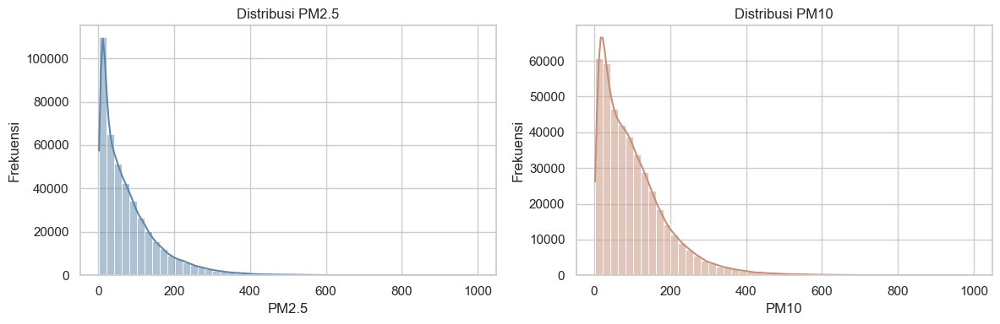

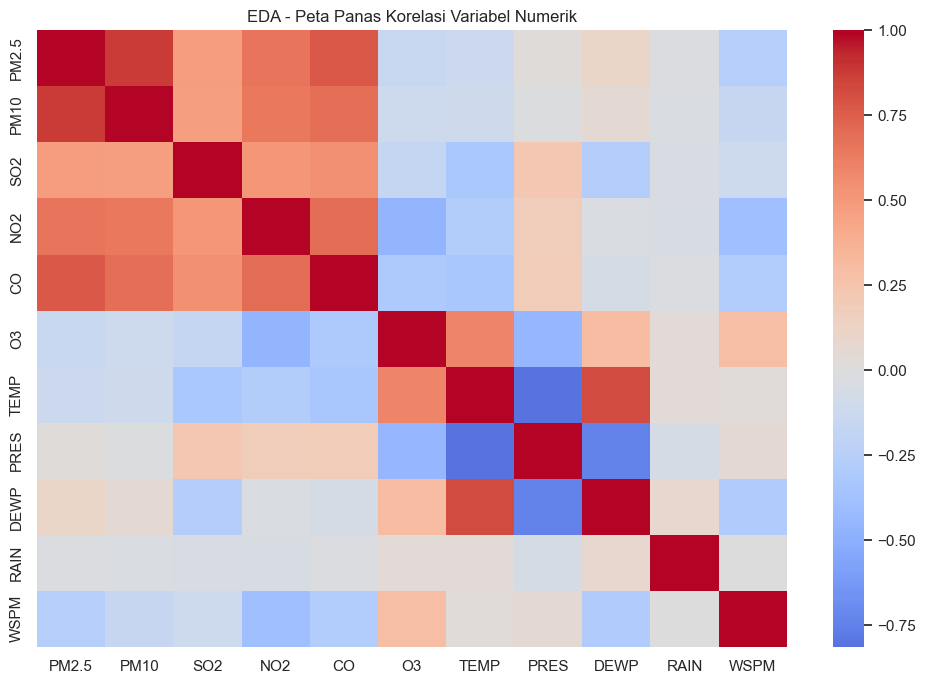

In [10]:
# EDA - Visual 1 s.d 3 (ringkas): Distribusi PM + korelasi
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for ax, (col, color) in zip(axes, [("PM2.5", SOFT_BLUE), ("PM10", SOFT_PEACH)]):
    sns.histplot(clean_df[col], bins=50, kde=True, color=color, ax=ax)
    ax.set_title(f"Distribusi {col}")
    ax.set_xlabel(col)
    ax.set_ylabel("Frekuensi")
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 7))
sns.heatmap(correlation, cmap=SOFT_CMAP_DIV, center=0)
plt.title("EDA - Peta Panas Korelasi Variabel Numerik")
plt.tight_layout()
plt.show()




Insight EDA (Ringkas):
- Distribusi tidak normal: PM2.5 & PM10 miring ke kanan, menandakan adanya lonjakan polusi ekstrem yang perlu jadi fokus.
- Sumber emisi serupa: Korelasi kuat PM2.5, PM10, CO, NO₂ → kemungkinan berasal dari kendaraan/industri, sehingga satu intervensi bisa berdampak ganda.
- O₃ berperilaku berbeda: Negatif terhadap polutan primer, positif kuat dengan suhu → khas polutan sekunder fotokimia, puncak saat panas.
- Meteorologi berpengaruh besar: Korelasi suhu–tekanan (-0.81) menunjukkan cuaca kuat mempengaruhi akumulasi dan dispersi polutan.
- Pola waktu kontras: Polutan primer tinggi di musim dingin/jam sibuk, O₃ tinggi di musim panas/siang → kebijakan perlu spesifik waktu.

### EDA Univariate 

Ringkasan bentuk distribusi (skewness & kurtosis):


,mean,median,std,skewness,kurtosis
PM2.5,79.840,55.0,80.950,2.020,5.975
PM10,104.910,82.0,92.431,1.927,6.526
CO,1235.683,900.0,1161.791,2.631,9.864
NO2,50.599,43.0,35.172,1.051,1.210
SO2,15.913,7.0,21.897,3.181,17.932
O3,57.238,44.0,57.135,1.715,6.532


Hasil uji normalitas Shapiro-Wilk (sampel max 5000 per variabel):


,variabel,n_sample,shapiro_stat,shapiro_pvalue,normal_5pct
0,PM2.5,5000,0.8199,0.0,Tidak
1,PM10,5000,0.8409,0.0,Tidak
2,CO,5000,0.7593,0.0,Tidak
3,NO2,5000,0.9256,0.0,Tidak
4,SO2,5000,0.6645,0.0,Tidak
5,O3,5000,0.8581,0.0,Tidak


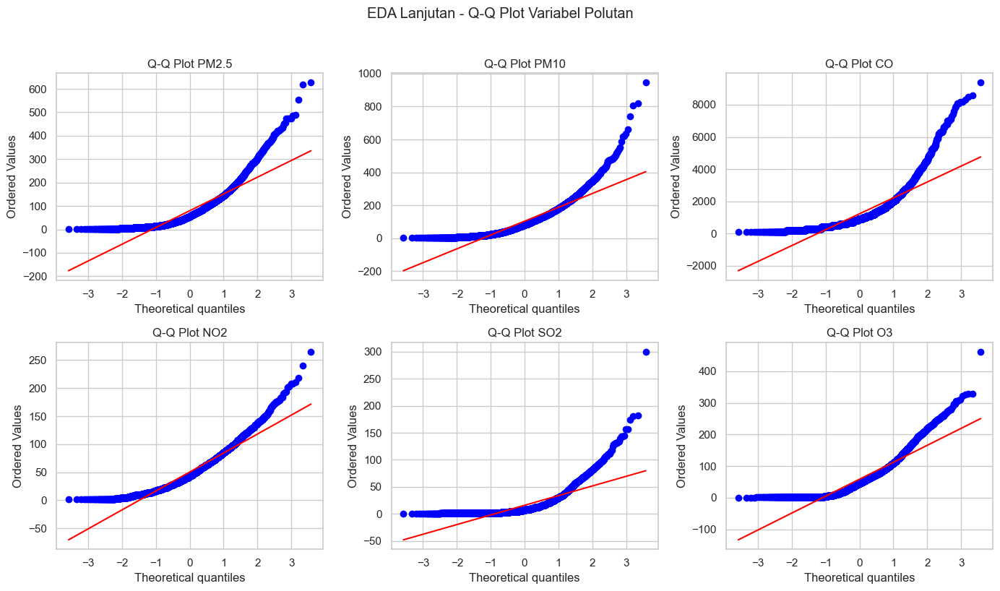

Insight cepat: variabel paling tidak simetris adalah SO2 (skewness=3.181).


In [11]:
pollutant_cols = POLLUTANT_COLS

shape_stats = pd.DataFrame({
    "mean": clean_df[pollutant_cols].mean(),
    "median": clean_df[pollutant_cols].median(),
    "std": clean_df[pollutant_cols].std(),
    "skewness": clean_df[pollutant_cols].skew(),
    "kurtosis": clean_df[pollutant_cols].kurt()
}).round(3)

normality_rows = []
for col in pollutant_cols:
    series = clean_df[col].dropna()
    sample_n = min(5000, len(series))
    sample = series.sample(sample_n, random_state=42)
    shapiro_stat, shapiro_p = stats.shapiro(sample)
    normality_rows.append({
        "variabel": col,
        "n_sample": sample_n,
        "shapiro_stat": round(shapiro_stat, 4),
        "shapiro_pvalue": round(shapiro_p, 8),
        "normal_5pct": "Ya" if shapiro_p > 0.05 else "Tidak"
    })
normality_df = pd.DataFrame(normality_rows)

print("Ringkasan bentuk distribusi (skewness & kurtosis):")
display(shape_stats)
print("Hasil uji normalitas Shapiro-Wilk (sampel max 5000 per variabel):")
display(normality_df)

# Q-Q plot digabung agar tidak repetitif
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()
for ax, col in zip(axes, pollutant_cols):
    series = clean_df[col].dropna()
    sample = series.sample(min(4000, len(series)), random_state=42)
    stats.probplot(sample, dist="norm", plot=ax)
    ax.set_title(f"Q-Q Plot {col}")
plt.suptitle("EDA Lanjutan - Q-Q Plot Variabel Polutan", y=1.02)
plt.tight_layout()
plt.show()

max_skew_var = shape_stats["skewness"].abs().idxmax()
print(
    f"Insight cepat: variabel paling tidak simetris adalah {max_skew_var} "
    f"(skewness={shape_stats.loc[max_skew_var, 'skewness']:.3f})."
)


Insight EDA (Univariate Lanjutan):
- Tidak ada polutan berdistribusi normal: Uji Shapiro–Wilk (p=0.0) menunjukkan semua variabel non-normal → analisis non-parametrik lebih sesuai.
- Distribusi miring ke kanan: Skewness semua polutan positif (0.9–3.2); SO₂ paling ekstrem (3.18), mayoritas nilai berada di level rendah.
- Ekor berat & banyak outlier: Kurtosis >1.2 pada semua polutan (SO₂ ≈17.9) menandakan keberadaan outlier ekstrem signifikan.
- Q-Q plot mengonfirmasi non-normalitas: Titik menyimpang dari garis diagonal, terutama di ekor atas, menunjukkan deviasi distribusi.
- Median & IQR lebih representatif: Untuk data non-normal dan ber-outlier, median/IQR lebih robust dibanding mean/standar deviasi.

### EDA Outlier IQR

,polutan,q1,q3,iqr,lower_bound,upper_bound,n_outlier,pct_outlier
4,SO2,3.0,20.0,17.0,-22.5,45.5,36626,8.70
2,CO,500.0,1500.0,1000.0,-1000.0,3000.0,29224,6.95
0,PM2.5,20.0,111.0,91.0,-116.5,247.5,19612,4.66
5,O3,10.0,82.0,72.0,-98.0,190.0,16662,3.96
1,PM10,36.0,145.0,109.0,-127.5,308.5,15150,3.60
3,NO2,23.0,71.0,48.0,-49.0,143.0,7255,1.72


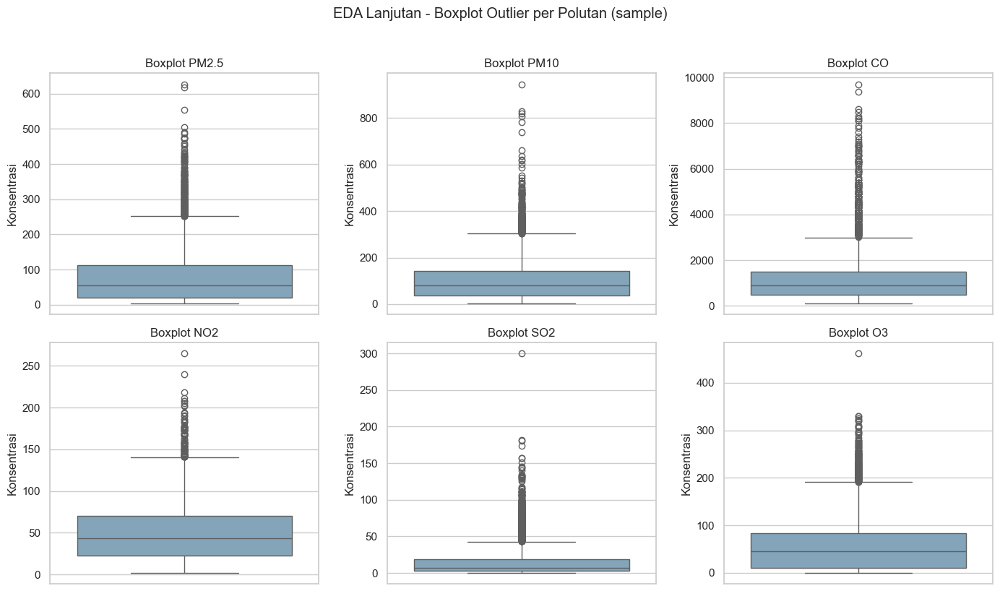

Insight cepat: proporsi outlier tertinggi ada pada SO2 (8.70% data).


In [12]:
# Analisis Nilai Ekstrem (Outlier IQR)
outlier_rows = []
for col in pollutant_cols:
    series = clean_df[col].dropna()
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    mask = (series < lower) | (series > upper)
    outlier_rows.append({
        "polutan": col,
        "q1": round(q1, 3),
        "q3": round(q3, 3),
        "iqr": round(iqr, 3),
        "lower_bound": round(lower, 3),
        "upper_bound": round(upper, 3),
        "n_outlier": int(mask.sum()),
        "pct_outlier": round(mask.mean() * 100, 2)
    })

outlier_df = pd.DataFrame(outlier_rows).sort_values("pct_outlier", ascending=False)
display(outlier_df)

# Boxplot outlier per polutan (digabung)
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()
for ax, col in zip(axes, pollutant_cols):
    series = clean_df[col].dropna()
    sample = series.sample(min(5000, len(series)), random_state=42)
    sns.boxplot(y=sample, ax=ax, color="#7aa6c2")
    ax.set_title(f"Boxplot {col}")
    ax.set_ylabel("Konsentrasi")
plt.suptitle("EDA Lanjutan - Boxplot Outlier per Polutan (sample)", y=1.02)
plt.tight_layout()
plt.show()

top_outlier = outlier_df.iloc[0]
print(
    f"Insight cepat: proporsi outlier tertinggi ada pada {top_outlier['polutan']} "
    f"({top_outlier['pct_outlier']:.2f}% data)."
)


Insight EDA (Outlier):
- Semua polutan memiliki outlier: Seluruh variabel polutan mengandung nilai ekstrem, dengan proporsi 1,72% hingga 8,70% dari total data.
- SO2 paling banyak outlier: SO2 mencatat proporsi outlier tertinggi (8,7%), diikuti CO (6,95%) dan PM2.5 (4,66%).
- Outlier merepresentasikan episode polusi ekstrem: Nilai-nilai ekstrem ini bukan kesalahan data, melainkan kejadian nyata polusi tinggi yang penting untuk analisis risiko.
- Jangan hapus outlier secara agresif: Menghilangkan outlier berisiko menghilangkan sinyal kritis untuk kebijakan pengendalian polusi.
- Gunakan metode robust untuk modeling: Untuk analisis lanjutan, pertahankan outlier dan gunakan teknik robust scaling atau winsorization.


### Ringkasan EDA
- Distribusi tidak normal & banyak outlier: Semua polutan right-skewed dengan ekor berat (kurtosis tinggi) dan mengandung 1,7–8,7% outlier yang merepresentasikan episode polusi ekstrem, bukan error data.
- Sumber emisi sama untuk polutan primer: PM2.5, PM10, CO, dan NO2 berkorelasi kuat (0.66–0.88), mengindikasikan sumber bersama dari kendaraan/industri yang memerlukan intervensi terpadu.
- O3 berperilaku berbeda: O3 berkorelasi negatif dengan polutan primer namun positif kuat dengan suhu (0.60), menegaskan sifatnya sebagai polutan sekunder fotokimia dengan pola temporal terbalik.
- Pola temporal-spasial yang kuat: Polutan primer meningkat di musim dingin dan jam sibuk, sementara O3 memuncak di musim panas dan siang hari. Analisis lanjutan perlu mempertimbangkan dimensi waktu dan lokasi secara eksplisit.
- Data siap analisis & meteorologi berperan: Data hasil cleaning memiliki struktur konsisten dan siap digunakan. Korelasi kuat suhu-tekanan (-0.81) menegaskan kondisi cuaca sangat mempengaruhi akumulasi/dispersi polutan.


## Visualization & Explanatory Analysis

### Pertanyaan Bisnis 1:
Bagaimana tren perbaikan kualitas udara dan kapan waktu kritis (jam, hari, bulan, tahun) yang perlu menjadi fokus pengawasan pada periode 2013-2017?

In [13]:
# Q1 - Persiapan data visual temporal
monthly_cols = PM_COLS + GAS_VIS_ORDER
monthly_pol = (
    clean_df.groupby("month_year", as_index=False)[monthly_cols]
    .mean()
    .sort_values("month_year")
)
monthly_pol["month_year"] = pd.to_datetime(monthly_pol["month_year"], errors="coerce")


In [14]:
# Q1 - Visual 1 s.d 3: Tren Tahunan/Bulanan PM dan Gas
fig = make_subplots(
    rows=3,
    cols=1,
    shared_xaxes=False,
    vertical_spacing=0.10,
    subplot_titles=(
        "Visual 1 - Tren Tahunan PM2.5 & PM10",
        "Visual 2 - Tren Bulanan PM2.5 & PM10",
        "Visual 3 - Tren Bulanan Polutan Gas (NO2, SO2, O3, CO)",
    ),
)

for col in PM_COLS:
    fig.add_trace(go.Scatter(x=yearly_avg["year"], y=yearly_avg[col], mode="lines+markers", name=f"{col} tahunan"), row=1, col=1)
for col in PM_COLS:
    fig.add_trace(go.Scatter(x=monthly_pol["month_year"], y=monthly_pol[col], mode="lines", name=f"{col} bulanan"), row=2, col=1)
for col in ["NO2", "SO2", "O3", "CO"]:
    fig.add_trace(go.Scatter(x=monthly_pol["month_year"], y=monthly_pol[col], mode="lines", name=col), row=3, col=1)

fig.update_layout(template="soft_beijing", height=980, title="Q1 - Tren Perbaikan Berdasarkan Waktu")
fig.update_xaxes(title_text="Tahun", row=1, col=1)
fig.update_xaxes(title_text="Bulan-Tahun", row=2, col=1)
fig.update_xaxes(title_text="Bulan-Tahun", row=3, col=1)
fig.update_yaxes(title_text="Konsentrasi", row=1, col=1)
fig.update_yaxes(title_text="Konsentrasi", row=2, col=1)
fig.update_yaxes(title_text="Konsentrasi", row=3, col=1)
fig.show()



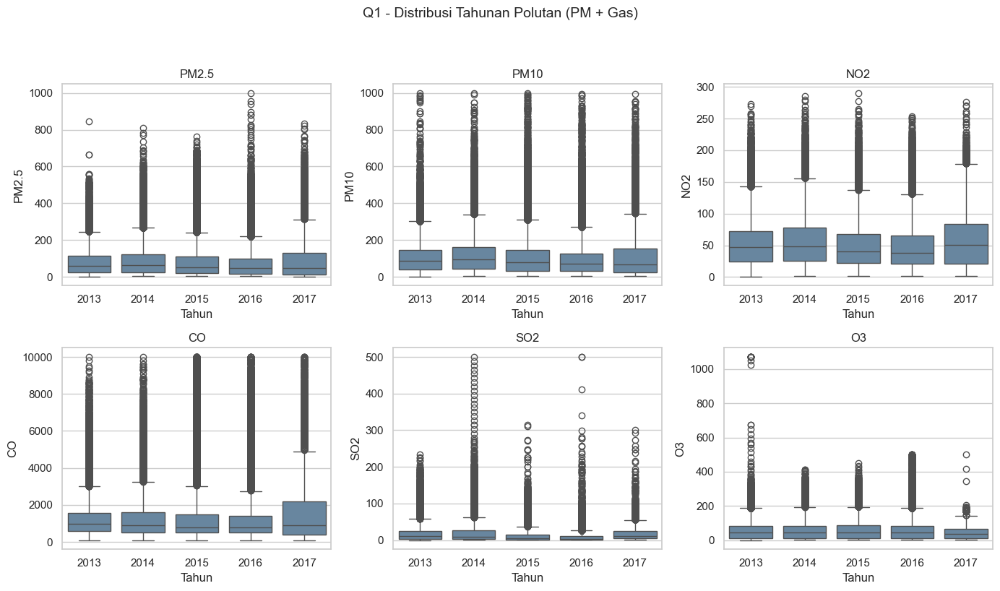

In [15]:
# Q1 - Visual 4 & 5: Distribusi tahunan semua polutan
year_order = sorted(clean_df["year"].dropna().unique())
all_pols = PM_COLS + GAS_VIS_ORDER

fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()
for ax, pol in zip(axes, all_pols):
    sns.boxplot(data=clean_df, x="year", y=pol, order=year_order, ax=ax)
    ax.set_title(pol)
    ax.set_xlabel("Tahun")
    ax.set_ylabel(pol)

fig.suptitle("Q1 - Distribusi Tahunan Polutan (PM + Gas)", y=1.02, fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


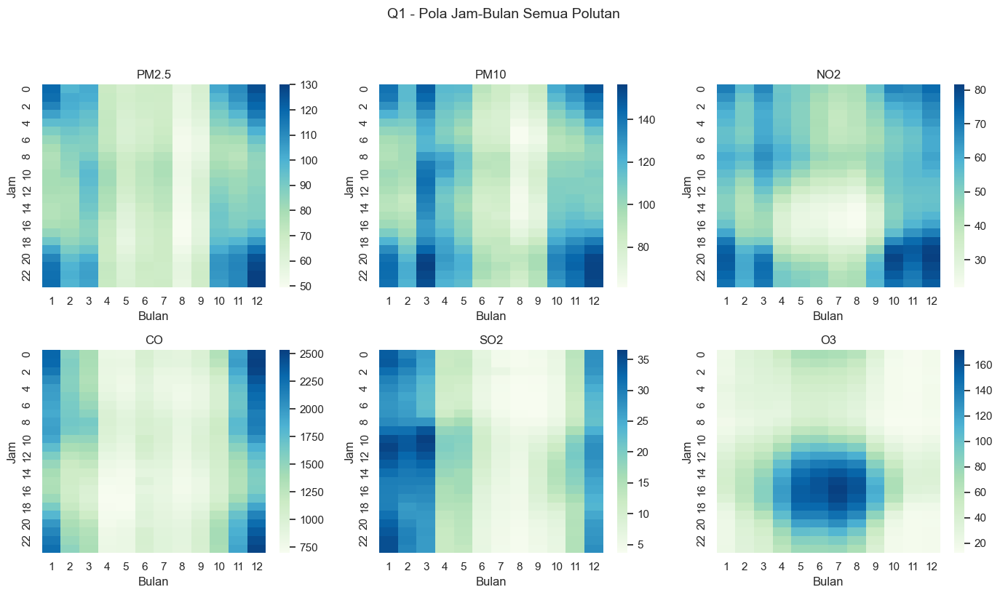

In [16]:
# Q1 - Visual 6 & 7: Heatmap jam vs bulan semua polutan
all_pols = PM_COLS + GAS_VIS_ORDER
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()

for ax, pol in zip(axes, all_pols):
    pivot = clean_df.pivot_table(index="hour", columns="month", values=pol, aggfunc="mean")
    sns.heatmap(pivot, cmap=SOFT_CMAP_HEAT, ax=ax)
    ax.set_title(pol)
    ax.set_xlabel("Bulan")
    ax.set_ylabel("Jam")

fig.suptitle("Q1 - Pola Jam-Bulan Semua Polutan", y=1.02, fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()



In [17]:
# Q1 - Tabel ringkas bulan dan jam puncak semua polutan
all_pols = PM_COLS + GAS_VIS_ORDER
month_peak = (
    clean_df.groupby("month")[all_pols]
    .mean().idxmax().rename("peak_month").reset_index().rename(columns={"index": "pollutant"})
)
hour_peak = (
    clean_df.groupby("hour")[all_pols]
    .mean().idxmax().rename("peak_hour").reset_index().rename(columns={"index": "pollutant"})
)
peak_table = month_peak.merge(hour_peak, on="pollutant", how="inner")
display(peak_table)


,pollutant,peak_month,peak_hour
0,PM2.5,12,22
1,PM10,3,21
2,NO2,12,22
3,CO,12,1
4,SO2,1,11
5,O3,7,16


Insight Q1 (Tren dan Waktu Kritis 2013-2017):
- Tren Memburuk di Akhir Periode: Kualitas udara justru memburuk drastis di 2017 dengan lonjakan PM2.5 (60→125) dan PM10 (60→130), sehingga investigasi perlu difokuskan pada tahun tersebut.
- Periode Kritis Bulanan: Desember puncak NO2/CO, Januari puncak SO2, dan Juli puncak O3, sehingga pengawasan intensif perlu dilakukan pada November-Februari.
- Pola Musiman PM: Potensi puncak PM di musim kemarau (Juni-Agustus) saat minim curah hujan, sejalan dengan puncak O3 di Juli.
- Pola Harian (Jam Kritis): Puncak polusi terjadi pada jam berbeda: NO2 (22.00), CO (01.00), SO2 (11.00), dan O3 (16.00), sehingga pengawasan perlu disesuaikan jadwalnya.
- Kejadian Ekstrem (Outlier):Terdapat hari-hari dengan polusi jauh di atas normal yang perlu diidentifikasi tanggal spesifiknya dan dikaitkan dengan faktor pemicu


### Pertanyaan 2:
Pada setiap musim dalam periode 2013-2017, faktor meteorologi apa yang paling berkontribusi terhadap peningkatan risiko polusi?


In [18]:
# Q2 - Persiapan data asosiasi musiman/temporal
assoc_df = clean_df.copy()
assoc_df["season_en"] = assoc_df["season"].astype(str).str.upper()

season_order = [s for s in SEASON_ORDER_STD if s in assoc_df["season_en"].dropna().unique()]
season_order_label = [SEASON_LABEL_ID.get(s, s) for s in season_order]

season_pm_met = corr_by_group(assoc_df, "season_en", PM_COLS, MET_COLS, groups=season_order)
season_gas_met = corr_by_group(assoc_df, "season_en", GAS_COLS, MET_COLS, groups=season_order)


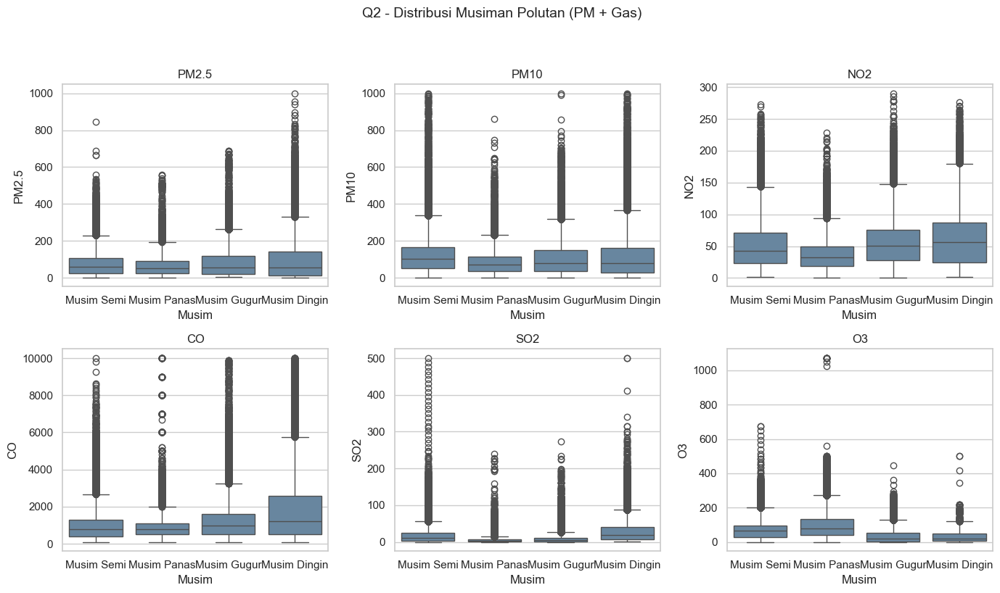

In [19]:
# Q2 - Visual 1 & 2: Distribusi musiman semua polutan
plot_season_df = clean_df.copy()
plot_season_df["season_label"] = plot_season_df["season"].map(SEASON_LABEL_ID).fillna(plot_season_df["season"])

all_pols = PM_COLS + GAS_VIS_ORDER
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()
for ax, pol in zip(axes, all_pols):
    sns.boxplot(data=plot_season_df, x="season_label", y=pol, order=season_order_label, ax=ax)
    ax.set_title(pol)
    ax.set_xlabel("Musim")
    ax.set_ylabel(pol)

fig.suptitle("Q2 - Distribusi Musiman Polutan (PM + Gas)", y=1.02, fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


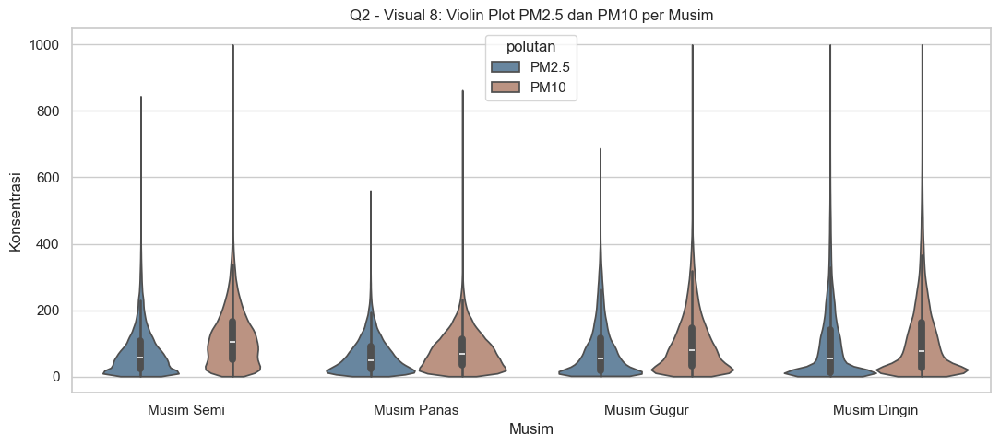

In [20]:
# Q2 - Visual 8: Violin Plot PM2.5 dan PM10 per Musim
violin_df = clean_df[["season"] + PM_COLS].dropna().melt(
    id_vars="season", value_vars=PM_COLS,
    var_name="polutan", value_name="konsentrasi",
)

violin_df["season_label"] = violin_df["season"].map(SEASON_LABEL_ID).fillna(violin_df["season"])

plt.figure(figsize=(11, 5))
sns.violinplot(
    data=violin_df,
    x="season_label",
    y="konsentrasi",
    hue="polutan",
    order=season_order_label,
    split=False,
    cut=0,
)
plt.title("Q2 - Visual 8: Violin Plot PM2.5 dan PM10 per Musim")
plt.xlabel("Musim")
plt.ylabel("Konsentrasi")
plt.tight_layout()
plt.show()


In [21]:
# Visual 2 - Monthly Violin Distribution
if "q2_h1_df" not in globals():
    q2_h1_df = clean_df.copy()
    q2_h1_df["month_num"] = q2_h1_df["month"] if "month" in q2_h1_df.columns else q2_h1_df["datetime"].dt.month
    q2_h1_df["month_label"] = q2_h1_df["month_num"].apply(lambda m: pd.Timestamp(2000, int(m), 1).strftime("%b"))

if "month_order_lbl" not in globals():
    month_order_lbl = [pd.Timestamp(2000, m, 1).strftime("%b") for m in range(1, 13)]

fig_violin_q2 = px.violin(
    q2_h1_df,
    x="month_label",
    y="PM2.5",
    category_orders={"month_label": month_order_lbl},
    box=True,
    points=False,
    template="soft_beijing",
    title="Q2 - Distribusi PM2.5 per Bulan"
)
fig_violin_q2.update_layout(xaxis_title="Bulan", yaxis_title="PM2.5 (ug/m3)")
fig_violin_q2.show()



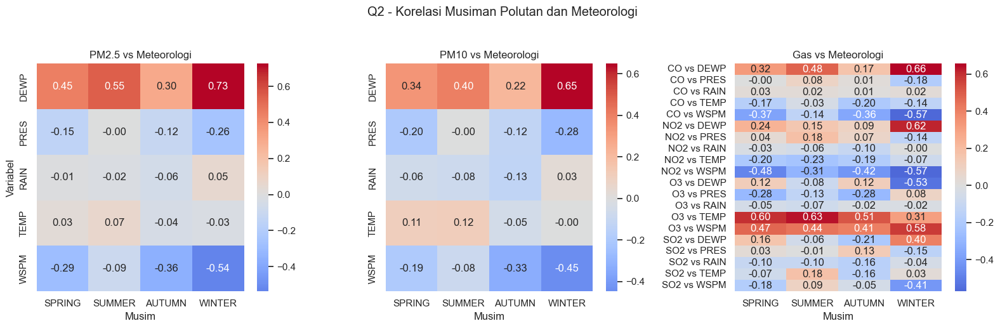

In [22]:
# Q2 - Visual 3 & 4: Korelasi polutan dan faktor meteorologi per musim (Spearman)
pm25_met = (
    season_pm_met[season_pm_met["left"] == "PM2.5"]
    .pivot(index="right", columns="group", values="rho")
    .reindex(columns=season_order)
)
pm10_met = (
    season_pm_met[season_pm_met["left"] == "PM10"]
    .pivot(index="right", columns="group", values="rho")
    .reindex(columns=season_order)
)

plot_gas_met = season_gas_met.copy()
plot_gas_met["pair"] = plot_gas_met["left"] + " vs " + plot_gas_met["right"]
pivot_gas_met = plot_gas_met.pivot(index="pair", columns="group", values="rho").reindex(columns=season_order)

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
sns.heatmap(pm25_met, annot=True, fmt=".2f", cmap=SOFT_CMAP_DIV, center=0, ax=axes[0])
axes[0].set_title("PM2.5 vs Meteorologi")
axes[0].set_xlabel("Musim")
axes[0].set_ylabel("Variabel")

sns.heatmap(pm10_met, annot=True, fmt=".2f", cmap=SOFT_CMAP_DIV, center=0, ax=axes[1])
axes[1].set_title("PM10 vs Meteorologi")
axes[1].set_xlabel("Musim")
axes[1].set_ylabel("")

sns.heatmap(pivot_gas_met, annot=True, fmt=".2f", cmap=SOFT_CMAP_DIV, center=0, ax=axes[2])
axes[2].set_title("Gas vs Meteorologi")
axes[2].set_xlabel("Musim")
axes[2].set_ylabel("")

fig.suptitle("Q2 - Korelasi Musiman Polutan dan Meteorologi", y=1.03)
plt.tight_layout()
plt.show()



,season_en,wd,PM2.5,O3
2,AUTUMN,ESE,103.86,35.58
0,AUTUMN,E,102.49,29.03
1,AUTUMN,ENE,101.02,21.55
18,SPRING,ESE,97.51,68.66
16,SPRING,E,94.99,52.70
25,SPRING,SE,93.35,80.97
34,SUMMER,ESE,81.62,99.07
41,SUMMER,SE,81.15,119.08
42,SUMMER,SSE,79.49,139.18
48,WINTER,E,147.06,18.19


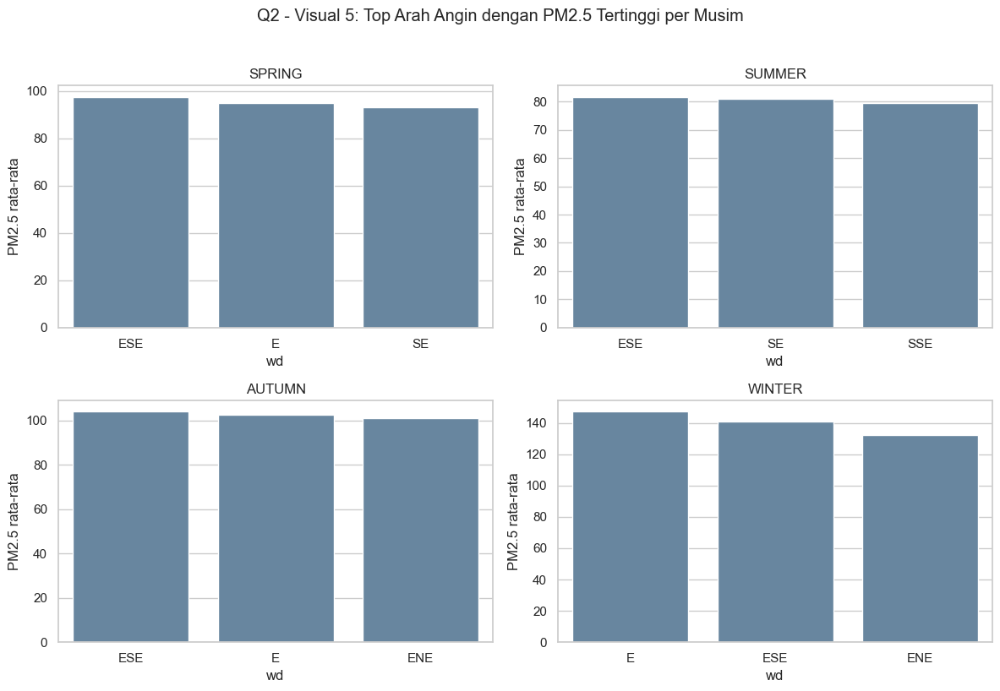

In [23]:
# Q2 - Visual 5: Arah Angin (wd) dan Rerata PM2.5 per Musim
wd_summary = (
    assoc_df.groupby(["season_en", "wd"])[["PM2.5", "PM10", "CO", "NO2", "SO2", "O3"]]
    .mean()
    .reset_index()
)

top_wd_pm25 = (
    wd_summary.sort_values(["season_en", "PM2.5"], ascending=[True, False])
    .groupby("season_en")
    .head(3)
)

display(top_wd_pm25[["season_en", "wd", "PM2.5", "O3"]].round(2))

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()
for i, s in enumerate(season_order):
    sub = top_wd_pm25[top_wd_pm25["season_en"] == s]
    sns.barplot(data=sub, x="wd", y="PM2.5", ax=axes[i], color=SOFT_BLUE)
    axes[i].set_title(s)
    axes[i].set_xlabel("wd")
    axes[i].set_ylabel("PM2.5 rata-rata")

fig.suptitle("Q2 - Visual 5: Top Arah Angin dengan PM2.5 Tertinggi per Musim", y=1.02)
plt.tight_layout()
plt.show()



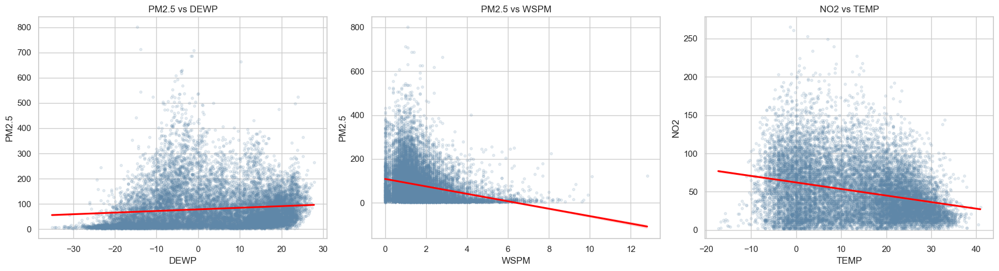

In [24]:
# Q2 - Visual 6: Scatter + Regression (Hubungan Bivariat Kunci)
bivariate_cols = ["PM2.5", "DEWP", "WSPM", "NO2", "TEMP", "season"]
bivariate_df = clean_df[bivariate_cols].dropna().sample(min(15000, clean_df[bivariate_cols].dropna().shape[0]), random_state=42)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.regplot(data=bivariate_df, x="DEWP", y="PM2.5", scatter_kws={"alpha":0.15, "s":10}, line_kws={"color":"red"}, ax=axes[0])
axes[0].set_title("PM2.5 vs DEWP")

sns.regplot(data=bivariate_df, x="WSPM", y="PM2.5", scatter_kws={"alpha":0.15, "s":10}, line_kws={"color":"red"}, ax=axes[1])
axes[1].set_title("PM2.5 vs WSPM")

sns.regplot(data=bivariate_df, x="TEMP", y="NO2", scatter_kws={"alpha":0.15, "s":10}, line_kws={"color":"red"}, ax=axes[2])
axes[2].set_title("NO2 vs TEMP")

plt.tight_layout()
plt.show()


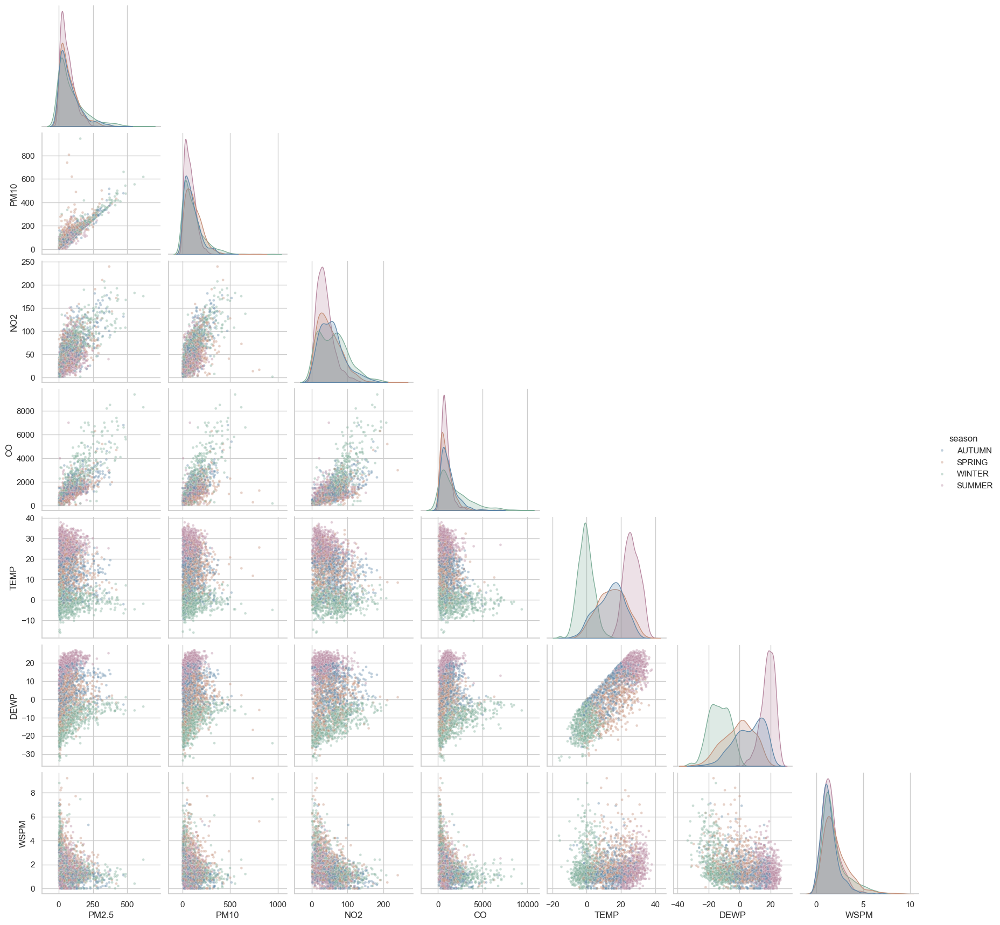

In [25]:
pair_cols = ['PM2.5', 'PM10', 'NO2', 'CO', 'TEMP', 'DEWP', 'WSPM']
pair_sample = clean_df[pair_cols + ['season']].sample(min(2500, len(clean_df)), random_state=42)

sns.pairplot(pair_sample, vars=pair_cols, hue='season', corner=True, plot_kws={'alpha':0.4, 's':12})
plt.show()

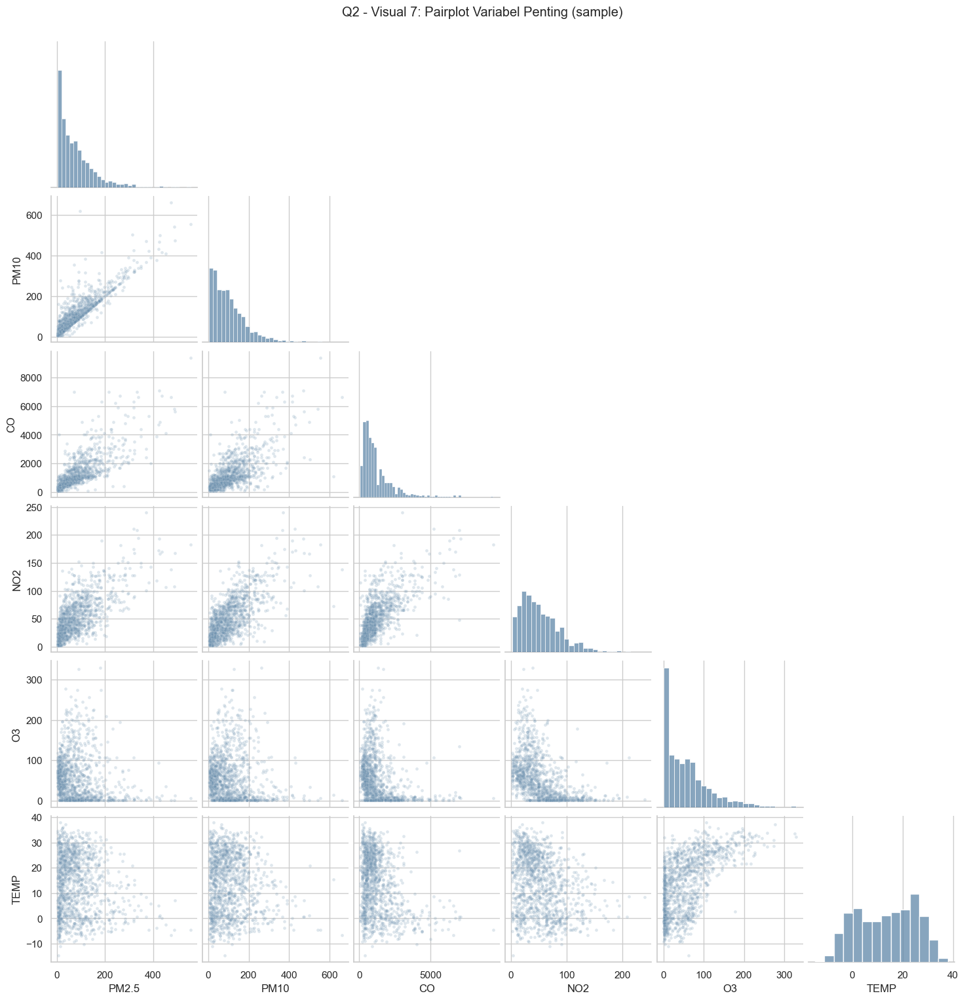

In [26]:
# Q2 - Visual 7: Pairplot Variabel Penting
pairplot_cols = ["PM2.5", "PM10", "CO", "NO2", "O3", "TEMP"]
pair_df = clean_df[pairplot_cols].dropna().sample(min(1200, clean_df[pairplot_cols].dropna().shape[0]), random_state=42)

sns.pairplot(
    pair_df,
    corner=True,
    diag_kind="hist",
    plot_kws={"alpha":0.2, "s":12},
)
plt.suptitle("Q2 - Visual 7: Pairplot Variabel Penting (sample)", y=1.02)
plt.show()


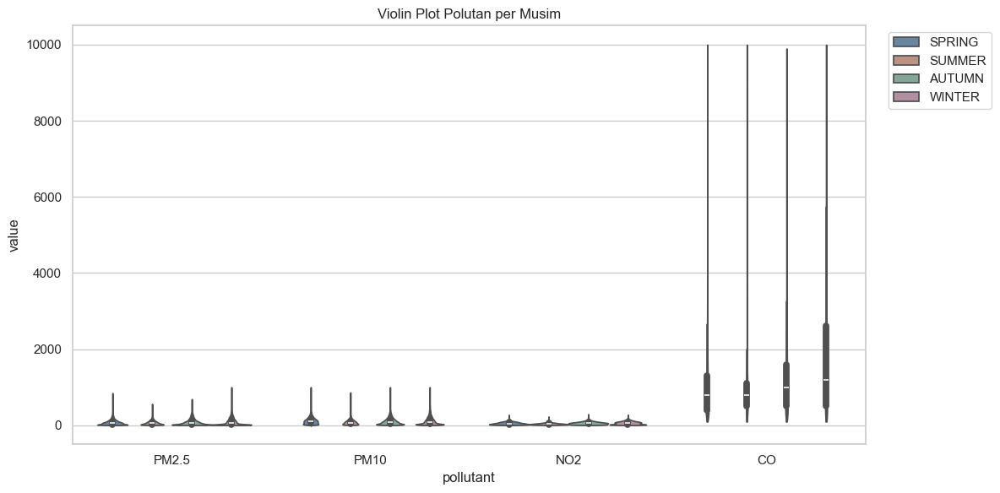

In [27]:
melt_df = clean_df.melt(id_vars=['season'], value_vars=['PM2.5','PM10','NO2','CO'], var_name='pollutant', value_name='value')

plt.figure(figsize=(12, 6))
sns.violinplot(data=melt_df, x='pollutant', y='value', hue='season', cut=0)
plt.title('Violin Plot Polutan per Musim')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

### Q2 - Visual Tambahan: AQI Seasonal Distribution (Subplot/Violin)
Visual tambahan ini menampilkan distribusi AQI per musim dalam dua bentuk: subplot boxplot dan violin plot.

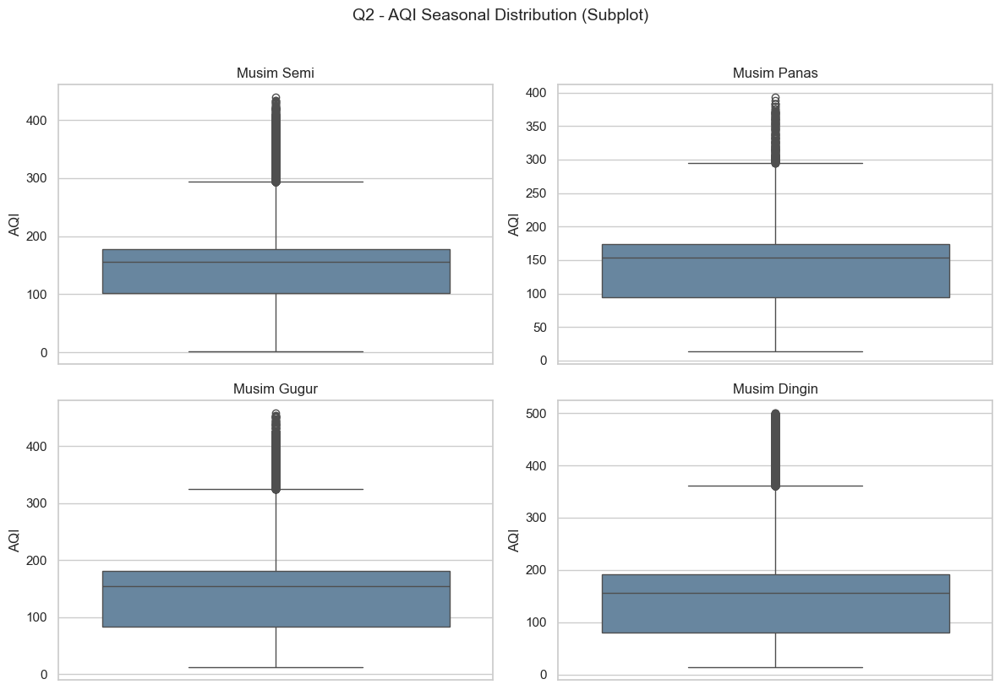

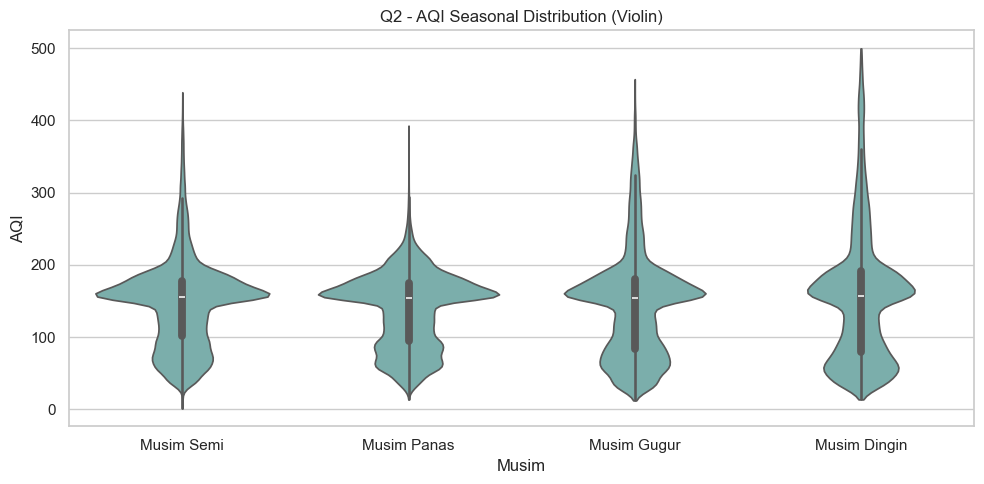

In [28]:
# Q2 - Visual Tambahan: AQI Seasonal Distribution (Subplot + Violin)
aqi_base = clean_df.copy()

# Pastikan kolom AQI tersedia di tahap Q2 notebook.
if "AQI" in aqi_base.columns:
    aqi_col = "AQI"
elif "aqi_overall" in aqi_base.columns:
    aqi_col = "aqi_overall"
elif "build_aqi_features" in globals():
    aqi_base = build_aqi_features(aqi_base)
    aqi_col = "AQI" if "AQI" in aqi_base.columns else "aqi_overall"
else:
    raise KeyError("Kolom AQI belum tersedia. Jalankan cell utilitas AQI (build_aqi_features) terlebih dahulu.")

if aqi_col not in aqi_base.columns:
    raise KeyError(f"Kolom AQI tidak ditemukan. Kolom yang dicari: 'AQI' atau 'aqi_overall'.")

aqi_season_df = aqi_base[["season", aqi_col]].dropna().copy()
aqi_season_df["season_label"] = aqi_season_df["season"].map(SEASON_LABEL_ID).fillna(aqi_season_df["season"])
aqi_season_df = aqi_season_df.rename(columns={aqi_col: "AQI_value"})

if 'season_order_label' in globals() and len(season_order_label) > 0:
    aqi_order = [s for s in season_order_label if s in aqi_season_df["season_label"].unique()]
else:
    aqi_order = sorted(aqi_season_df["season_label"].dropna().unique().tolist())

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()
for i, season_name in enumerate(aqi_order[:4]):
    sub = aqi_season_df[aqi_season_df["season_label"] == season_name]
    sns.boxplot(data=sub, y="AQI_value", ax=axes[i], color=SOFT_BLUE)
    axes[i].set_title(season_name)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("AQI")

for j in range(len(aqi_order[:4]), 4):
    axes[j].axis("off")

fig.suptitle("Q2 - AQI Seasonal Distribution (Subplot)", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
sns.violinplot(
    data=aqi_season_df,
    x="season_label",
    y="AQI_value",
    order=aqi_order,
    cut=0,
    inner="box",
    color="#72b7b2",
)
plt.title("Q2 - AQI Seasonal Distribution (Violin)")
plt.xlabel("Musim")
plt.ylabel("AQI")
plt.tight_layout()
plt.show()




Insight Q2 (Meteorologi dan Risiko Polusi 2013-2017):
- DEWP (Titik Embun) sebagai Faktor Penjerat Polusi
DEWP berkorelasi positif dengan PM2.5 di semua musim. Udara lembab menyebabkan partikel mengembang dan terperangkap di permukaan, terutama berisiko tinggi saat musim dingin.
- WSPM (Kecepatan Angin) sebagai Faktor Dispersi
WSPM berkorelasi negatif dengan seluruh polutan. Angin rendah (stagnan) memicu akumulasi polusi, sementara angin kencang membersihkan udara. Periode stagnan perlu diwaspadai.
- Suhu (TEMP) Memiliki Efek Berlawanan
TEMP berkorelasi negatif dengan PM, CO, NO2 (tinggi di musim dingin), namun positif dengan O3 (tinggi di musim panas). Pengawasan perlu dibedakan per musim.
- Tekanan Tinggi (PRES) Memperparah, Hujan (RAIN) Membersihkan
PRES tinggi (udara stabil) memerangkap polutan di musim dingin, sedangkan RAIN efektif membersihkan atmosfer. Waspada saat tekanan tinggi tanpa hujan.
- Arah Angin Menentukan Sumber Polusi
Arah angin tertentu membawa polusi spesifik: ESE/E membawa PM2.5 tinggi di musim dingin, sedangkan SE/SSE membawa O3 tinggi di musim panas. Identifikasi sumber emisi berdasarkan arah angin dominan.


## Analisis Lanjutan (Opsional)

### Pertanyaan 3:
Berdasarkan data periode 2013-2017, polutan apa yang menjadi penyebab utama penurunan kualitas udara, dan bagaimana prioritas pengendaliannya berdasarkan tingkat risiko?


In [29]:
# Q3: Risiko AQI multi-polutan (tanpa ML)
base_df = build_aqi_features(clean_df)

labels6 = AQI_CATEGORY_ORDER
o3_8h_labels = O3_CATEGORY_ORDER

def pct(series, labels):
    return (series.value_counts(normalize=True).reindex(labels) * 100).fillna(0)

summary_main = pd.DataFrame({
    "PM2.5 (24h)": pct(base_df["pm25_cat"], labels6),
    "PM10 (24h)": pct(base_df["pm10_cat"], labels6),
    "CO (8h)": pct(base_df["co_cat"], labels6),
    "NO2 (1h)": pct(base_df["no2_cat"], labels6),
    "SO2 (1h)": pct(base_df["so2_cat"], labels6),
}).round(2)

o3_table = pct(base_df["o3_8h_cat"], o3_8h_labels).to_frame("O3 (8h)").round(2)

display(summary_main)
display(o3_table)

def severe_share(series, severe_labels):
    valid = series.dropna()
    if valid.empty:
        return 0.0
    return float(valid.isin(severe_labels).mean() * 100)

severe_main = {
    "PM2.5 (24h)": severe_share(base_df["pm25_cat"], ["Unhealthy", "Very Unhealthy", "Hazardous"]),
    "PM10 (24h)": severe_share(base_df["pm10_cat"], ["Unhealthy", "Very Unhealthy", "Hazardous"]),
    "CO (8h)": severe_share(base_df["co_cat"], ["Unhealthy", "Very Unhealthy", "Hazardous"]),
    "NO2 (1h)": severe_share(base_df["no2_cat"], ["Unhealthy", "Very Unhealthy", "Hazardous"]),
    "SO2 (1h)": severe_share(base_df["so2_cat"], ["Unhealthy", "Very Unhealthy", "Hazardous"]),
    "O3 (8h)": severe_share(base_df["o3_8h_cat"], ["Unhealthy", "Very Unhealthy"]),
}
severe_df = (
    pd.DataFrame({"polutan": list(severe_main.keys()), "severe_pct": list(severe_main.values())})
    .sort_values("severe_pct", ascending=False)
)
display(severe_df)
print("Severe shares:", severe_main)


,PM2.5 (24h),PM10 (24h),CO (8h),NO2 (1h),SO2 (1h)
Good,3.37,27.75,98.56,90.16,98.41
Moderate,26.53,52.63,1.44,9.61,1.56
Unhealthy for Sensitive Groups,15.66,14.61,0.00,0.24,0.03
Unhealthy,35.96,3.88,0.00,0.00,0.00
Very Unhealthy,13.60,0.75,0.00,0.00,0.00
Hazardous,4.88,0.38,0.00,0.00,0.00


,O3 (8h)
o3_8h_cat,
Good,85.35
Moderate,6.29
Unhealthy for Sensitive Groups,3.64
Unhealthy,3.04
Very Unhealthy,1.66
Outside 8h AQI scope,0.03


,polutan,severe_pct
0,PM2.5 (24h),54.439323
1,PM10 (24h),5.006754
5,O3 (8h),4.701153
4,SO2 (1h),0.000951
2,CO (8h),0.000000
3,NO2 (1h),0.000000


Severe shares: {'PM2.5 (24h)': 54.43932345918591, 'PM10 (24h)': 5.006753992941602, 'CO (8h)': 0.0, 'NO2 (1h)': 0.0, 'SO2 (1h)': 0.0009506426344208684, 'O3 (8h)': 4.701153359766475}


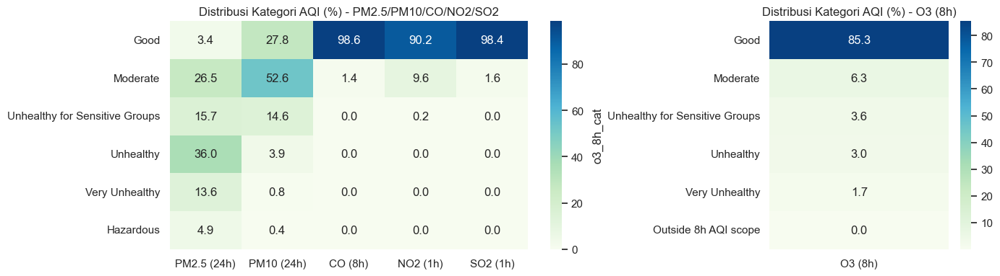

In [30]:
# Q3 - Visual 2: Heatmap distribusi kategori AQI (utama + O3)
fig, axes = plt.subplots(1, 2, figsize=(14, 4), gridspec_kw={"width_ratios": [2, 1]})

sns.heatmap(summary_main, annot=True, fmt=".1f", cmap=SOFT_CMAP_HEAT, ax=axes[0])
axes[0].set_title("Distribusi Kategori AQI (%) - PM2.5/PM10/CO/NO2/SO2")

sns.heatmap(o3_table, annot=True, fmt=".1f", cmap=SOFT_CMAP_HEAT, ax=axes[1])
axes[1].set_title("Distribusi Kategori AQI (%) - O3 (8h)")

plt.tight_layout()
plt.show()



Insight Q3 (Risiko Multi-Polutan):
- PM2.5 mendominasi kategori tidak sehat dengan kontribusi 54,4% pada kondisi sangat tidak sehat hingga berbahaya, menjadikannya polutan paling kritis.
- PM10 berkontribusi 5% pada kategori tidak sehat, terutama dari partikel kasar seperti debu dan aktivitas konstruksi yang perlu dikendalikan.
- Ozon troposfer (O3) menyumbang 4,7% pada kondisi tidak sehat, terutama di musim panas dengan pembentukan fotokimia yang intensif.
- Gas Polutan (CO, NO2, SO2) Relatif Terkendali : Kontribusi gas polutan pada kategori tidak sehat mendekati 0%, menunjukkan bahwa kebijakan pengendalian emisi gas relatif berhasil.
- Prioritas Pengendalian Berlapis : Fokus utama pada PM2.5 (partikel halus), prioritas kedua PM10 (partikel kasar), dan pemantauan O3 serta gas sebagai faktor prekursor.

### AQI Overall (Resmi) & Perbandingan Antar Stasiun
Ringkasan AQI overall untuk melengkapi Q3, dengan metode resmi breakpoint AQI.

In [31]:
# Q3 - Tambahan Data: AQI overall resmi (max sub-index), bukan rata-rata 6 polutan
base_df = build_aqi_features(base_df if "base_df" in globals() else clean_df)

category_order = AQI_CATEGORY_ORDER
category_colors = AQI_CATEGORY_COLORS

overall_dist = (
    base_df["aqi_overall_category"].value_counts(normalize=True)
    .reindex(category_order)
    .fillna(0)
    .mul(100)
    .round(2)
    .reset_index()
)
overall_dist.columns = ["Kategori AQI", "Persentase (%)"]

display(overall_dist)


,Kategori AQI,Persentase (%)
0,Good,6.67
1,Moderate,22.31
2,Unhealthy for Sensitive Groups,15.50
3,Unhealthy,41.21
4,Very Unhealthy,10.92
5,Hazardous,3.38


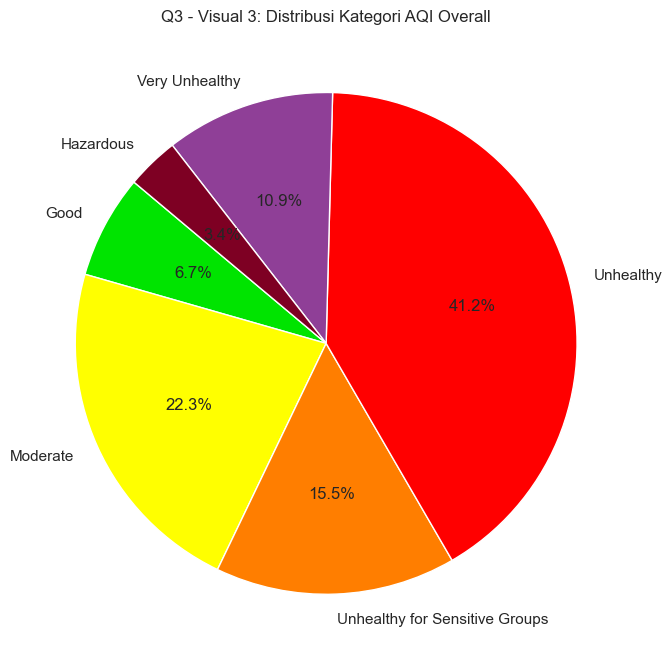

In [32]:
# Q3 - Visual 3: Distribusi Kategori AQI Overall (Pie)
plot_dist = overall_dist[overall_dist['Persentase (%)'] > 0].copy()

plt.figure(figsize=(7, 7))
plt.pie(
    plot_dist['Persentase (%)'],
    labels=plot_dist['Kategori AQI'],
    autopct='%1.1f%%',
    startangle=140,
    colors=[category_colors[c] for c in plot_dist['Kategori AQI']],
    wedgeprops={'edgecolor': 'white', 'linewidth': 1}
)
plt.title('Q3 - Visual 3: Distribusi Kategori AQI Overall')
plt.tight_layout()
plt.show()


Insight Q3 (AQI Overall):
- Sebanyak 41,2% hari dalam periode 2013-2017 masuk kategori Unhealthy, menjadikannya proporsi terbesar dan indikator krisis kualitas udara kronis.
- Gabungan kategori Unhealthy (41,2%), Very Unhealthy (10,9%), dan Hazardous (3,1%) mencapai 55,2%, berarti lebih dari separuh hari berisiko tinggi bagi kesehatan.
- Hanya 6,7% hari yang masuk kategori Good, menunjukkan kualitas udara bersih sangat jarang terjadi selama periode pengamatan.
-  Kategori Moderate (22,3%) dan Unhealthy for Sensitive Groups (15,5%) mendominasi sisa hari, berarti kelompok sensitif (lansia, anak, penderita penyakit pernapasan) hampir selalu dalam risiko.
- Dominasi kategori tidak sehat yang konsisten menandakan perlunya intervensi struktural jangka panjang, bukan sekadar penanganan insidental.


### Subbagian Q3 - Pola AQI Overall Berdasarkan Waktu (Tahun, Musim, Bulan, Hari, Jam)
Analisis ini menambahkan view temporal agar prioritas pengendalian pada Q3 tidak hanya berdasarkan polutan, tetapi juga kapan risiko AQI cenderung lebih tinggi.


,month_year,aqi_overall
0,2013-03-01,165.16
1,2013-04-01,132.61
2,2013-05-01,157.13
3,2013-06-01,169.81
4,2013-07-01,142.33
5,2013-08-01,136.59
6,2013-09-01,143.34
7,2013-10-01,156.51
8,2013-11-01,136.17
9,2013-12-01,143.08


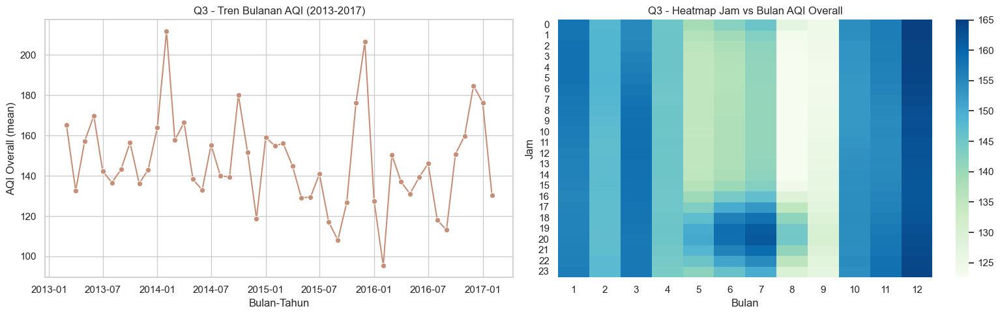

In [33]:
# Q3 - Visual 1 & 6: Tren bulanan dan heatmap jam-bulan AQI overall
base_df = build_aqi_features(base_df if "base_df" in globals() else clean_df)

monthly_aqi = (
    base_df.loc[(base_df["year"] >= 2013) & (base_df["year"] <= 2017)]
    .groupby("month_year", as_index=False)["aqi_overall"]
    .mean()
    .sort_values("month_year")
)
monthly_aqi["month_year"] = pd.to_datetime(monthly_aqi["month_year"], errors="coerce")

display(monthly_aqi[["month_year", "aqi_overall"]].round(2))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sns.lineplot(data=monthly_aqi, x="month_year", y="aqi_overall", marker="o", color=SOFT_PEACH, ax=axes[0])
axes[0].set_title("Q3 - Tren Bulanan AQI (2013-2017)")
axes[0].set_xlabel("Bulan-Tahun")
axes[0].set_ylabel("AQI Overall (mean)")

pivot_aqi = base_df.pivot_table(index="hour", columns="month", values="aqi_overall", aggfunc="mean")
sns.heatmap(pivot_aqi, cmap=SOFT_CMAP_HEAT, ax=axes[1])
axes[1].set_title("Q3 - Heatmap Jam vs Bulan AQI Overall")
axes[1].set_xlabel("Bulan")
axes[1].set_ylabel("Jam")

plt.tight_layout()
plt.show()



Insight Q3 (AQI Temporal):
- Temuan: Pola AQI menurut tahun, musim, bulan, hari, dan jam memperlihatkan jendela waktu yang konsisten untuk peningkatan risiko.
- Implikasi: Intervensi emisi perlu bersifat time-bound karena beban risiko tidak merata sepanjang waktu.
- Aksi: Gunakan profil waktu AQI sebagai dasar penjadwalan operasi pengendalian pada jam sibuk dan musim berisiko tinggi.


aqi_overall_category,Good,Moderate,Unhealthy for Sensitive Groups,Unhealthy,Very Unhealthy,Hazardous
station,,,,,,
Dongsi,5.40,20.72,14.82,43.46,11.29,4.31
Wanshouxigong,5.77,19.82,15.39,43.74,11.06,4.22
Gucheng,5.05,20.56,15.42,43.99,11.17,3.80
Nongzhanguan,6.45,19.84,15.24,42.11,11.95,4.40
Wanliu,5.70,21.03,15.25,43.23,11.03,3.76
Tiantan,5.85,20.70,15.66,42.94,11.39,3.45
Guanyuan,4.88,21.54,15.84,43.54,10.55,3.65
Aotizhongxin,5.70,21.14,15.65,42.72,11.05,3.75
Shunyi,6.57,22.82,15.28,41.11,11.04,3.19


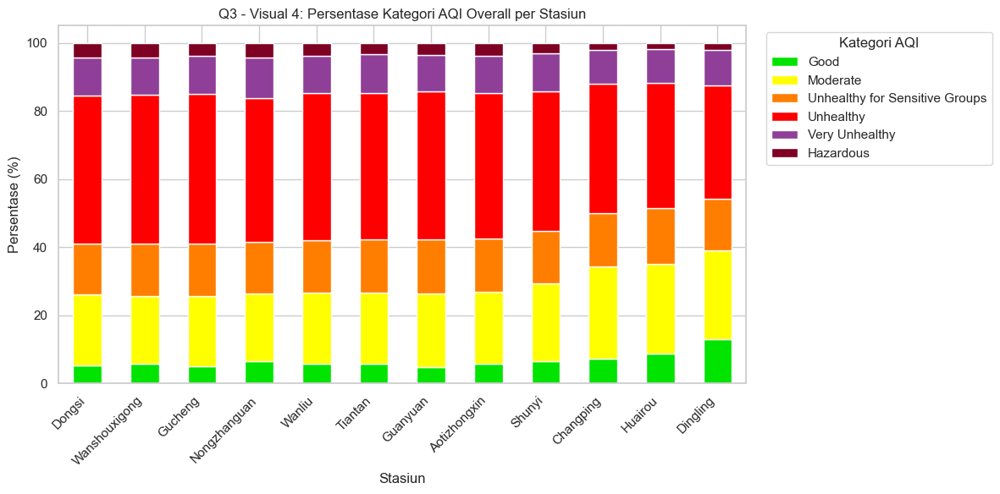

In [34]:
# Q3 - Visual 4: Komposisi Kategori AQI per Stasiun (Stacked)
station_comp = pd.crosstab(
    base_df['station'],
    base_df['aqi_overall_category'],
    normalize='index'
).mul(100).reindex(columns=category_order, fill_value=0)

station_comp['risk_score'] = station_comp[['Unhealthy','Very Unhealthy','Hazardous']].sum(axis=1)
station_comp = station_comp.sort_values('risk_score', ascending=False).drop(columns='risk_score')

display(station_comp.round(2).head(12))

ax = station_comp.plot(
    kind='bar',
    stacked=True,
    figsize=(12, 6),
    color=[category_colors[c] for c in station_comp.columns]
)
ax.set_title('Q3 - Visual 4: Persentase Kategori AQI Overall per Stasiun')
ax.set_xlabel('Stasiun')
ax.set_ylabel('Persentase (%)')
ax.legend(title='Kategori AQI', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [35]:
# Q3 - Tabel Tambahan: 3 Stasiun Terbaik dan Terburuk (berdasarkan AQI overall)
station_aqi = base_df.groupby('station', as_index=False)['aqi_overall'].mean().sort_values('aqi_overall')

best3 = station_aqi.head(3).copy()
worst3 = station_aqi.tail(3).sort_values('aqi_overall', ascending=False).copy()

print('3 Stasiun Terbaik (AQI terendah):')
display(best3.round(2))
print('3 Stasiun Terburuk (AQI tertinggi):')
display(worst3.round(2))


3 Stasiun Terbaik (AQI terendah):


,station,aqi_overall
2,Dingling,131.50
6,Huairou,135.60
1,Changping,137.58


3 Stasiun Terburuk (AQI tertinggi):


,station,aqi_overall
3,Dongsi,152.91
11,Wanshouxigong,152.82
7,Nongzhanguan,152.39


Insight Q3 (Stasiun Terbaik/Terburuk):
- Bulan Februari 2014 (211,6) dan Desember 2015 (206,6) mencatat AQI tertinggi, mengindikasikan periode kritis di akhir tahun hingga awal tahun.
- Musim dingin konsisten menunjukkan AQI tinggi (Februari 2014, Desember 2015, Januari 2017), diikuti musim semi dengan pola fluktuatif namun tetap signifikan.
- Dongsi (152,9), Wanshouxigong (152,8), dan Nongzhanguan (152,4) menjadi tiga stasiun dengan AQI terburuk, semuanya berada di pusat aktivitas perkotaan.
- Dingling (131,5), Huairou (135,6), dan Changping (137,6) mencatat AQI terendah, menunjukkan perbaikan kualitas udara seiring menjauh dari pusat kota.
- Selisih AQI mencapai 21 poin antara stasiun terburuk dan terbaik, menegaskan perlunya kebijakan pengendalian yang ditargetkan secara spasial.


### Pertanyaan 4:
Area mana yang memerlukan intervensi prioritas berdasarkan tingkat polusi PM2.5 dan gas polutan pada periode 2013-2017?


In [36]:
# Q4 - Persiapan data geospasial dan clustering manual area prioritas
station_summary = (
    clean_df.groupby("station", as_index=False)
    .agg({
        "PM2.5": "mean",
        "zone": lambda x: x.mode().iat[0] if not x.mode().empty else np.nan,
    })
    .merge(station_coords[["station", "lat", "lon"]], on="station", how="left")
    .sort_values("PM2.5", ascending=False)
)

station_gas = (
    clean_df.groupby("station", as_index=False)[GAS_VIS_ORDER]
    .mean()
)

source_df = build_aqi_features(base_df if "base_df" in globals() else clean_df)
source_df["aqi_category"] = source_df["aqi_overall_category"].astype(str)

station_met_aqi = (
    source_df.groupby("station", as_index=False)
    .agg({
        "aqi_overall": "mean",
        "TEMP": "mean",
        "WSPM": "mean",
        "aqi_category": lambda x: x.mode().iat[0] if not x.mode().empty else np.nan,
    })
)

station_priority = (
    station_summary
    .merge(station_gas, on="station", how="left")
    .merge(station_met_aqi, on="station", how="left")
)

station_priority = add_zscore_columns(station_priority, ["PM2.5"] + GAS_VIS_ORDER)
station_priority["gas_risk_score"] = station_priority[[f"z_{c}" for c in GAS_VIS_ORDER]].mean(axis=1)
station_priority["priority_score"] = 0.6 * station_priority["z_PM2.5"] + 0.4 * station_priority["gas_risk_score"]

# Cluster disamakan dengan skala PM2.5 (kuantil q1, q2, q3) seperti pada peta.
q1, q2, q3 = station_priority["PM2.5"].quantile([0.25, 0.50, 0.75])
station_priority["priority_cluster"] = pd.cut(
    station_priority["PM2.5"],
    bins=[-np.inf, q1, q2, q3, np.inf],
    labels=["Low Priority", "Medium Priority", "High Priority", "Very High Priority"]
)

print(f"Batas cluster PM2.5 (kuantil): <= {q1:.1f} | {q1:.1f}-{q2:.1f} | {q2:.1f}-{q3:.1f} | > {q3:.1f}")

display(station_priority[["station", "zone", "PM2.5", "NO2", "SO2", "CO", "O3", "aqi_overall", "aqi_category", "priority_score", "priority_cluster", "lat", "lon"]]
        .sort_values("priority_score", ascending=False)
        .round(3))

display(zone_avg_pm25)



Batas cluster PM2.5 (kuantil): <= 77.3 | 77.3-82.7 | 82.7-84.3 | > 84.3

,station,zone,PM2.5,NO2,SO2,CO,O3,aqi_overall,aqi_category,priority_score,priority_cluster,lat,lon
0,Dongsi,Urban,86.144,53.953,18.506,1331.913,57.700,152.911,Unhealthy,0.807,Very High Priority,39.929,116.417
1,Nongzhanguan,Urban,85.079,58.095,18.760,1327.768,58.433,152.392,Unhealthy,0.768,Very High Priority,39.937,116.461
2,Wanshouxigong,Urban,85.068,55.495,17.363,1373.619,55.920,152.819,Unhealthy,0.670,Very High Priority,39.878,116.352
3,Gucheng,Suburban,84.075,55.822,15.706,1338.100,58.000,152.205,Unhealthy,0.523,High Priority,39.914,116.184
4,Wanliu,Urban,83.468,65.668,18.410,1328.761,46.909,150.606,Unhealthy,0.450,High Priority,39.987,116.287
5,Guanyuan,Urban,82.898,58.139,17.609,1258.327,54.817,150.501,Unhealthy,0.395,High Priority,39.929,116.339
6,Aotizhongxin,Urban,82.541,59.074,17.459,1264.692,55.329,150.151,Unhealthy,0.378,Medium Priority,39.982,116.397
7,Tiantan,Urban,82.033,53.259,14.510,1305.333,56.148,149.970,Unhealthy,0.199,Medium Priority,39.886,116.407
8,Shunyi,Suburban,79.438,44.095,13.446,1197.905,54.219,145.902,Unhealthy,-0.288,Medium Priority,40.127,116.655
9,Changping,Suburban,70.986,44.206,14.943,1156.990,57.976,137.579,Unhealthy,-0.966,Low Priority,40.217,116.230


,zone,PM2.5
0,Urban,83.890017
1,Suburban,78.166400
2,Rural,68.173652


In [37]:
# Peta sederhana menggunakan folium
zone_colors = {
    'Urban': '#B87474',
    'Suburban': '#C9AB5F',
    'Rural': '#6DA184',
    'Perkotaan': '#B87474',
    'Pinggiran': '#C9AB5F',
    'Perdesaan': '#6DA184',
}
zone_label_id = {
    'Urban': 'Perkotaan',
    'Suburban': 'Pinggiran',
    'Rural': 'Perdesaan',
    'Perkotaan': 'Perkotaan',
    'Pinggiran': 'Pinggiran',
    'Perdesaan': 'Perdesaan',
}

# Skala radius berbasis kuantil PM2.5 agar outlier tidak mendominasi
q1, q2, q3 = station_summary['PM2.5'].quantile([0.25, 0.50, 0.75])

def pm_radius_quantile(val):
    if pd.isna(val):
        return 6
    if val <= q1:
        return 6
    if val <= q2:
        return 8
    if val <= q3:
        return 10
    return 12

m = folium.Map(
    location=[station_coords['lat'].mean(), station_coords['lon'].mean()],
    zoom_start=9,
    tiles='OpenStreetMap'
)
folium.TileLayer('CartoDB positron', name='CartoDB Positron').add_to(m)

# Label berdasarkan skor gabungan (PM2.5 24h + episode rate) per zona
score_df = clean_df.sort_values(['station', 'datetime']).copy()
score_df['pm25_24h'] = score_df.groupby('station')['PM2.5'].transform(
    lambda s: s.rolling(24, min_periods=24).mean()
)
score_df['episode'] = score_df['pm25_24h'] >= 125.5

station_score = (
    score_df.groupby(['station','zone'])
    .agg(pm25_mean=('pm25_24h','mean'), episode_rate=('episode','mean'))
    .reset_index()
)

station_score['pm25_z'] = (station_score['pm25_mean'] - station_score['pm25_mean'].mean()) / station_score['pm25_mean'].std()
station_score['episode_z'] = (station_score['episode_rate'] - station_score['episode_rate'].mean()) / station_score['episode_rate'].std()
station_score['score'] = station_score['pm25_z'] + station_score['episode_z']

label_stations = set(
    station_score.sort_values(['zone','score'], ascending=[True, False])
    .groupby('zone').head(3)['station']
    .tolist()
)

label_layer = folium.FeatureGroup(name='Labels', show=False)

for _, r in station_summary.iterrows():
    if pd.isna(r['lat']) or pd.isna(r['lon']):
        continue

    zone_key = str(r['zone']).strip() if pd.notna(r['zone']) else '-'
    zone_label = zone_label_id.get(zone_key, zone_key)
    marker_color = zone_colors.get(zone_key, '#555')

    folium.CircleMarker(
        location=[r['lat'], r['lon']],
        radius=pm_radius_quantile(r['PM2.5']),
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.8,
        tooltip=(
            f"{r['station']}<br>"
            f"Zone: {zone_label}<br>"
            f"PM2.5 mean: {r['PM2.5']:.1f}"
        )
    ).add_to(m)

    if r['station'] in label_stations:
        label_html = f'<div style="font-size:10px; color:#222; font-weight:bold;">{r["station"]}</div>'
        folium.Marker(
            location=[r['lat'], r['lon']],
            icon=folium.DivIcon(html=label_html)
        ).add_to(label_layer)

label_layer.add_to(m)

legend_html = """
<div style="position: fixed; bottom: 30px; left: 30px; z-index: 9999;
     background: white; padding: 10px 12px; border: 1px solid #999;
     border-radius: 4px; font-size: 12px;">
<strong>Zona</strong><br>
<span style="display:inline-block; width:10px; height:10px; background:#e74c3c; border-radius:50%; margin-right:6px;"></span><span style="color:#e74c3c; font-weight:600;">Perkotaan</span><br>
<span style="display:inline-block; width:10px; height:10px; background:#f1c40f; border-radius:50%; margin-right:6px;"></span><span style="color:#b58900; font-weight:600;">Pinggiran</span><br>
<span style="display:inline-block; width:10px; height:10px; background:#2ecc71; border-radius:50%; margin-right:6px;"></span><span style="color:#27ae60; font-weight:600;">Perdesaan</span>
</div>
"""

size_legend = f"""
<div style="position: fixed; bottom: 30px; right: 30px; z-index: 9999;
     background: white; padding: 10px 12px; border: 1px solid #999;
     border-radius: 4px; font-size: 12px;">
<strong>Skala PM2.5 (kuantil)</strong><br>
<span style="display:inline-block; width:12px; height:12px; border: 2px solid #333; border-radius: 50%;"></span>
<span style="margin-left:6px;">≤ {q1:.1f}</span><br>
<span style="display:inline-block; width:16px; height:16px; border: 2px solid #333; border-radius: 50%;"></span>
<span style="margin-left:6px;">≤ {q2:.1f}</span><br>
<span style="display:inline-block; width:20px; height:20px; border: 2px solid #333; border-radius: 50%;"></span>
<span style="margin-left:6px;">≤ {q3:.1f}</span><br>
<span style="display:inline-block; width:24px; height:24px; border: 2px solid #333; border-radius: 50%;"></span>
<span style="margin-left:6px;">> {q3:.1f}</span>
</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))
m.get_root().html.add_child(folium.Element(size_legend))
folium.LayerControl(collapsed=True).add_to(m)

zoom_threshold = 12
map_id = m.get_name()
label_id = label_layer.get_name()
script = """
<script>
(function() {{
  var map = {map_id};
  var labels = {label_id};
  function toggleLabels() {{
    if (map.getZoom() >= {zoom_threshold}) {{
      if (!map.hasLayer(labels)) {{ map.addLayer(labels); }}
    }} else {{
      if (map.hasLayer(labels)) {{ map.removeLayer(labels); }}
    }}
  }}
  map.on("zoomend", toggleLabels);
  toggleLabels();
}})();
</script>
""".format(map_id=map_id, label_id=label_id, zoom_threshold=zoom_threshold)

m.get_root().html.add_child(folium.Element(script))

from IPython.display import display, IFrame

try:
    display(m)
except Exception:
    m.save("q4_folium_map.html")
    display(IFrame("q4_folium_map.html", width=980, height=560))






/var/folders/rg/227_g6ws7ys64whyfwgmc5sc0000gn/T/ipykernel_21368/1526443885.py:48: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/rg/227_g6ws7ys64whyfwgmc5sc0000gn/T/ipykernel_21368/1526443885.py:59: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Catatan Asumsi dan Keterbatasan Analisis Geospasial dan Clustering Manual:
- Koordinat stasiun berasal dari Google Maps sebagai proksi visual, sehingga dipakai untuk pembandingan relatif antar lokasi.
- Clustering manual disamakan dengan skala PM2.5 kuantil (q1, q2, q3) agar konsisten dengan legenda peta.
- Bobot skor prioritas tetap ditetapkan 60% PM2.5 dan 40% gabungan gas polutan untuk menekankan risiko partikel halus terhadap kesehatan.



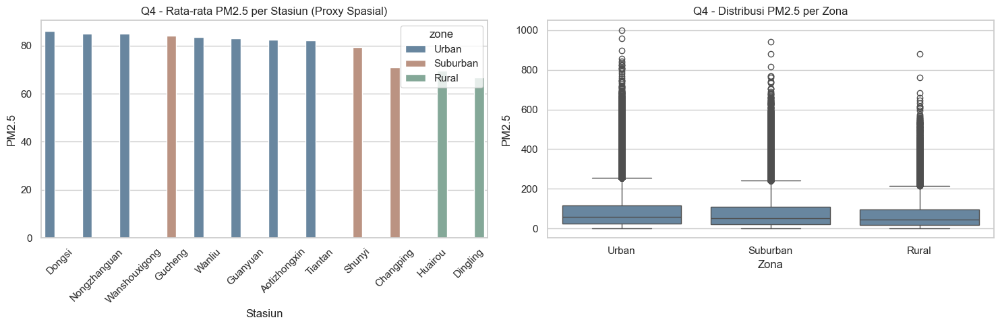

In [38]:
# Q4 - Visual 2 & 3: PM2.5 per stasiun dan distribusi per zona
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

sns.barplot(data=station_avg_pm25, x="station", y="PM2.5", hue="zone", ax=axes[0])
axes[0].set_title("Q4 - Rata-rata PM2.5 per Stasiun (Proxy Spasial)")
axes[0].set_xlabel("Stasiun")
axes[0].set_ylabel("PM2.5")
axes[0].tick_params(axis="x", rotation=45)

sns.boxplot(data=clean_df, x="zone", y="PM2.5", order=["Urban", "Suburban", "Rural"], ax=axes[1])
axes[1].set_title("Q4 - Distribusi PM2.5 per Zona")
axes[1].set_xlabel("Zona")
axes[1].set_ylabel("PM2.5")

plt.tight_layout()
plt.show()


,PM2.5,PM10,NO2,CO,SO2,O3
station,,,,,,
Aotizhongxin,82.54,110.21,59.07,1264.69,17.46,55.33
Changping,70.99,94.79,44.21,1156.99,14.94,57.98
Dingling,66.85,84.11,27.30,925.11,11.80,70.53
Dongsi,86.14,110.35,53.95,1331.91,18.51,57.70
Guanyuan,82.90,109.37,58.14,1258.33,17.61,54.82
Gucheng,84.07,119.26,55.82,1338.10,15.71,58.00
Huairou,69.50,92.42,32.08,1019.67,12.45,60.87
Nongzhanguan,85.08,109.38,58.10,1327.77,18.76,58.43
Shunyi,79.44,99.27,44.09,1197.90,13.45,54.22


,n_unique
PM2.5,12
PM10,12
NO2,12
CO,12
SO2,12
O3,12


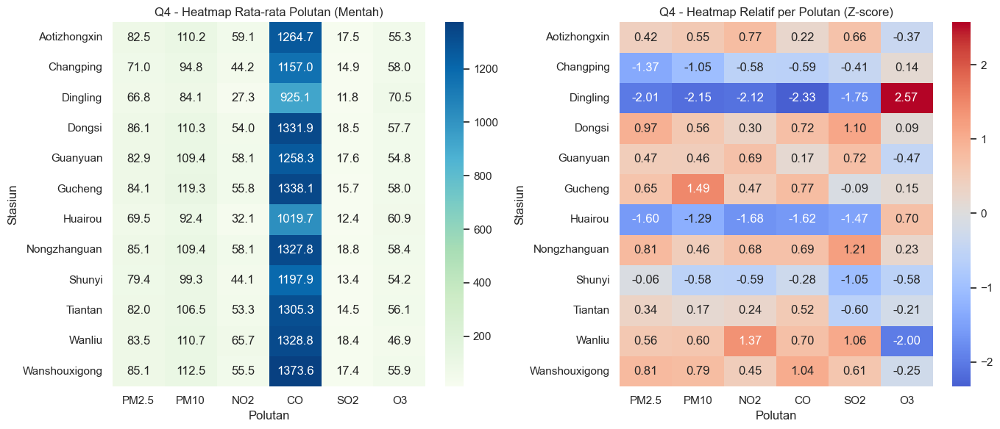

In [39]:
# Q4 - Visual 4A & 4B: Heatmap rata-rata polutan (mentah dan z-score)
pollutant_means = clean_df.groupby("station")[["PM2.5", "PM10", "NO2", "CO", "SO2", "O3"]].mean().round(2)
variation_check = pollutant_means.nunique().to_frame("n_unique")

display(pollutant_means)
display(variation_check)

pollutant_z = pollutant_means.apply(
    lambda col: (col - col.mean()) / col.std(ddof=0) if col.std(ddof=0) != 0 else 0,
    axis=0,
)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(pollutant_means, cmap=SOFT_CMAP_HEAT, annot=True, fmt=".1f", ax=axes[0])
axes[0].set_title("Q4 - Heatmap Rata-rata Polutan (Mentah)")
axes[0].set_xlabel("Polutan")
axes[0].set_ylabel("Stasiun")

sns.heatmap(pollutant_z, cmap=SOFT_CMAP_DIV, center=0, annot=True, fmt=".2f", ax=axes[1])
axes[1].set_title("Q4 - Heatmap Relatif per Polutan (Z-score)")
axes[1].set_xlabel("Polutan")
axes[1].set_ylabel("Stasiun")

plt.tight_layout()
plt.show()



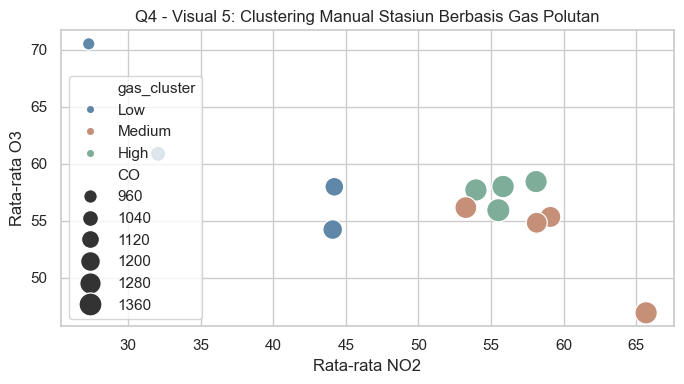

,gas_cluster,n_station
0,Low,4
1,Medium,4
2,High,4


,gas_cluster,NO2,CO,SO2,O3,gas_score
0,Low,36.92,1074.92,13.16,60.90,-0.73
1,Medium,59.04,1289.28,17.00,53.30,0.22
2,High,55.84,1342.85,17.58,57.51,0.51


,station,NO2,CO,SO2,O3,z_NO2,z_CO,z_SO2,z_O3,gas_score,gas_cluster
7,Nongzhanguan,58.095,1327.768,18.760,58.433,0.682,0.691,1.210,0.231,0.704,High
3,Dongsi,53.953,1331.913,18.506,57.700,0.305,0.723,1.102,0.089,0.555,High
11,Wanshouxigong,55.495,1373.619,17.363,55.920,0.445,1.036,0.616,-0.255,0.461,High
5,Gucheng,55.822,1338.100,15.706,58.000,0.475,0.769,-0.088,0.147,0.326,High
0,Aotizhongxin,59.074,1264.692,17.459,55.329,0.771,0.218,0.657,-0.369,0.319,Medium
10,Wanliu,65.668,1328.761,18.410,46.909,1.371,0.699,1.061,-1.997,0.283,Medium
4,Guanyuan,58.139,1258.327,17.609,54.817,0.686,0.170,0.721,-0.468,0.277,Medium
9,Tiantan,53.259,1305.333,14.510,56.148,0.242,0.523,-0.596,-0.211,-0.011,Medium
1,Changping,44.206,1156.990,14.943,57.976,-0.581,-0.591,-0.412,0.143,-0.360,Low
8,Shunyi,44.095,1197.905,13.446,54.219,-0.592,-0.284,-1.049,-0.584,-0.627,Low


In [40]:
# Q4 - Visual 5: Clustering Manual Stasiun Berbasis Gas Polutan (NO2, SO2, CO, O3)
station_gas_profile = (
    clean_df.groupby("station")[GAS_VIS_ORDER]
    .mean()
    .reset_index()
)

station_gas_profile = add_zscore_columns(station_gas_profile, GAS_VIS_ORDER)
station_gas_profile["gas_score"] = station_gas_profile[[f"z_{c}" for c in GAS_VIS_ORDER]].mean(axis=1)
q33, q66 = station_gas_profile["gas_score"].quantile([0.33, 0.66])

station_gas_profile["gas_cluster"] = pd.cut(
    station_gas_profile["gas_score"],
    bins=[-np.inf, q33, q66, np.inf],
    labels=["Low", "Medium", "High"]
)

cluster_count = station_gas_profile["gas_cluster"].value_counts().rename_axis("gas_cluster").reset_index(name="n_station")
cluster_summary = (
    station_gas_profile.groupby("gas_cluster", observed=False)[GAS_VIS_ORDER + ["gas_score"]]
    .mean()
    .round(2)
    .reset_index()
)

plt.figure(figsize=(7, 4))
sns.scatterplot(
    data=station_gas_profile,
    x="NO2",
    y="O3",
    hue="gas_cluster",
    size="CO",
    sizes=(80, 280)
)
plt.title("Q4 - Visual 5: Clustering Manual Stasiun Berbasis Gas Polutan")
plt.xlabel("Rata-rata NO2")
plt.ylabel("Rata-rata O3")
plt.tight_layout()
plt.show()

display(cluster_count)
display(cluster_summary)
display(station_gas_profile.sort_values("gas_score", ascending=False).round(3))


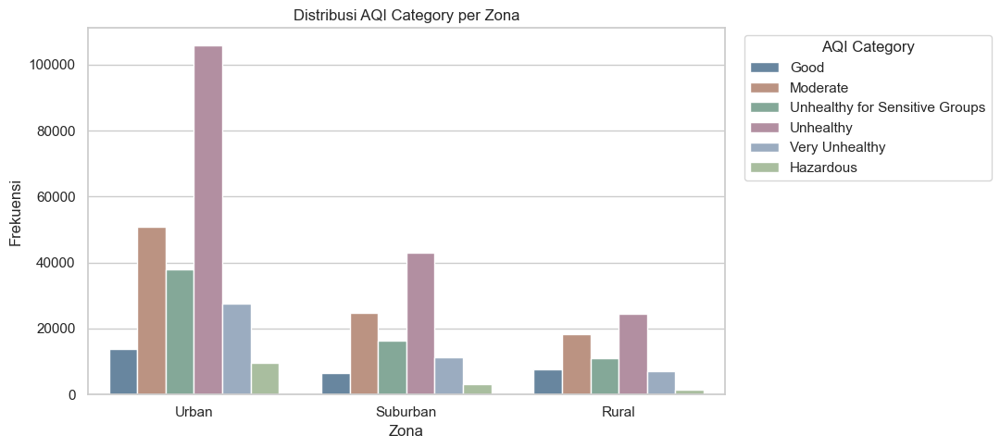

In [41]:
# Q3 - Countplot AQI category per zona
q3_plot_df = build_aqi_features(clean_df)
q3_plot_df["aqi_category"] = q3_plot_df["aqi_overall_category"].astype(str)
plot_df = q3_plot_df[["zone", "aqi_category"]].dropna().copy()

aqi_order = AQI_CATEGORY_ORDER

plt.figure(figsize=(11, 5))
sns.countplot(data=plot_df, x="zone", hue="aqi_category", hue_order=aqi_order)
plt.title("Distribusi AQI Category per Zona")
plt.xlabel("Zona")
plt.ylabel("Frekuensi")
plt.legend(title="AQI Category", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()


### Subbagian Q3 dan Q4 - Uji Kategorikal (Chi-Square dan Countplot)

In [42]:
# Q3 - Uji Kategorikal (Chi-Square)
q3_cat_df = build_aqi_features(clean_df)
q3_cat_df["aqi_category"] = q3_cat_df["aqi_overall_category"].astype(str)

cat_df = q3_cat_df[["zone", "season", "aqi_category", "PM2.5"]].dropna().copy()
cat_df["pm25_level_q"] = pd.qcut(cat_df["PM2.5"], q=3, labels=["Low", "Medium", "High"], duplicates="drop")

ct_zone_aqi = pd.crosstab(cat_df["zone"], cat_df["aqi_category"])
chi2_1, p_1, dof_1, _ = stats.chi2_contingency(ct_zone_aqi)

ct_season_pm = pd.crosstab(cat_df["season"], cat_df["pm25_level_q"])
chi2_2, p_2, dof_2, _ = stats.chi2_contingency(ct_season_pm)

chi_summary = pd.DataFrame([
    {"uji": "zone vs aqi_category", "chi2": round(chi2_1, 3), "p_value": round(p_1, 8), "signif_5pct": "Ya" if p_1 < 0.05 else "Tidak"},
    {"uji": "season vs pm25_level_q", "chi2": round(chi2_2, 3), "p_value": round(p_2, 8), "signif_5pct": "Ya" if p_2 < 0.05 else "Tidak"}
])

print("Contingency table - zone vs AQI category:")
display(ct_zone_aqi)
print("Contingency table - season vs PM2.5 level (quantile):")
display(ct_season_pm)
print("Ringkasan Chi-Square:")
display(chi_summary)


Contingency table - zone vs AQI category:


aqi_category,Good,Hazardous,Moderate,Unhealthy,Unhealthy for Sensitive Groups,Very Unhealthy
zone,,,,,,
Urban,13935,9654,50770,105803,37818,27468
Suburban,6586,3165,24711,43128,16275,11327
Rural,7556,1419,18403,24483,11134,7133


Contingency table - season vs PM2.5 level (quantile):


pm25_level_q,Low,Medium,High
season,,,
AUTUMN,35741,33072,36019
SPRING,30558,40914,34512
SUMMER,34133,43625,28226
WINTER,41119,22215,40634


Ringkasan Chi-Square:


,uji,chi2,p_value,signif_5pct
0,zone vs aqi_category,4600.685,0.0,Ya
1,season vs pm25_level_q,11819.360,0.0,Ya


Insight Q3 (Uji Kategorikal):
- Terdapat asosiasi signifikan antara zona dan kategori AQI (chi-square 4802, p=0), membuktikan pola kualitas udara berbeda secara nyata di urban, suburban, dan rural.
- Zona urban memiliki frekuensi tertinggi pada kategori Unhealthy (106.865) dan Very Unhealthy (23.993), mengkonfirmasi beban polusi terbesar di perkotaan.
- Zona rural didominasi kategori Good (7.782) dan Moderate (19.024) dengan jumlah kejadian tidak sehat jauh lebih rendah dibanding zona lain.
- Asosiasi signifikan antara musim dan level PM2.5 (chi-square 11.899, p=0) membuktikan pola musiman yang kuat dalam risiko polusi.
- Musim dingin memiliki PM2.5 High tertinggi (40.634) diikuti semi (34.512), sementara musim panas paling rendah (28.226) akibat efek dispersi.


Insight Q4 (Geospasial dan Clustering Manual):
- Stasiun urban seperti Dongsi, Nongzhanguan, dan Wanshouxigong memiliki PM2.5 tertinggi (85-86) dan masuk cluster High Priority, menjadikannya target intervensi utama.
- Dongsi, Nongzhanguan, dan Wanshouxigong mencatat PM2.5 >85, CO >1300, dan SO2 >17, kombinasi polutan tertinggi yang memerlukan penanganan segera.
- Konsentrasi polutan menurun konsisten dari urban (PM2.5 83,9) ke suburban (78,2) hingga rural (68,2), mengonfirmasi gradien spasial polusi.
- Stasiun dengan cluster gas High (Nongzhanguan, Dongsi, Wanshouxigong, Gucheng) seluruhnya berada di zona urban-suburban dengan skor gas tertinggi.
- Dingling, Huairou, dan Changping (rural) mencatat PM2.5 terendah (<71) dan didominasi cluster gas Low, cukup dengan strategi pemantauan preventif.


## Conclusion
- Pertanyaan 1: 
Analisis data kualitas udara Beijing periode 2013-2017 menunjukkan bahwa alih-alih mengalami perbaikan, kualitas udara justru memburuk secara drastis pada tahun 2017 dengan lonjakan signifikan konsentrasi PM2.5 dan PM10, menjadikannya fokus utama investigasi. Pengawasan perlu diintensifkan secara spesifik berdasarkan waktu kritis, yaitu pada bulan November hingga Februari untuk polutan NO2, CO, dan SO2 (dengan puncak di Desember-Januari), serta pada bulan Juni-Agustus untuk O3 (puncak di Juli). Dalam skala harian, periode kritis terjadi pada malam hingga dini hari (22.00-01.00) untuk akumulasi NO2 dan CO, serta siang hingga sore hari (11.00-16.00) untuk puncak SO2 dan O3, dengan keberadaan outlier yang konsisten mengindikasikan hari-hari dengan episode polusi ekstrem yang memerlukan investigasi lebih lanjut.

- Pertanyaan 2: 
Faktor meteorologi terbukti memiliki pengaruh signifikan terhadap risiko polusi dengan pola yang bervariasi di setiap musim, di mana titik embun (DEWP) menjadi faktor penjerap utama yang berkorelasi positif kuat dengan PM2.5 di semua musim, sementara kecepatan angin (WSPM) berperan sebagai faktor pembersih dengan korelasi negatif terhadap seluruh polutan. Suhu (TEMP) menunjukkan efek berlawanan dengan menekan polutan primer namun memicu pembentukan O3 di musim panas, sementara tekanan tinggi (PRES) memperparah akumulasi polutan dan curah hujan (RAIN) efektif membersihkan atmosfer. Selain itu, arah angin spesifik seperti Timur/Tenggara (ESE/E) terbukti membawa PM2.5 tinggi di musim dingin, sedangkan angin Selatan/Tenggara (SE/SSE) membawa O3 tinggi di musim panas, mengindikasikan sumber emisi yang berbeda berdasarkan arah angin dominan.

- Pertanyaan 3:
Berdasarkan analisis risiko multi-polutan, PM2.5 teridentifikasi sebagai penyebab utama krisis kualitas udara dengan kontribusi 54,4% pada kategori sangat tidak sehat hingga berbahaya, diikuti oleh PM10 (5%) dan O3 troposfer (4,7%), sementara gas polutan CO, NO2, dan SO2 relatif terkendali dengan kontribusi risiko mendekati nol. Hal ini menghasilkan skala prioritas pengendalian berlapis, yaitu prioritas utama pada PM2.5 (partikel halus dari pembakaran), prioritas kedua pada PM10 (partikel kasar dari debu dan konstruksi), dan prioritas pemantauan pada O3 (polutan sekunder fotokimia). Dalam konteks spasial, tiga stasiun dengan AQI terburuk adalah Dongsi, Wanshouxigong, dan Nongzhanguan yang berada di pusat perkotaan, sedangkan stasiun rural seperti Dingling mencatat AQI terbaik, menegaskan perlunya kebijakan pengendalian yang ditargetkan secara spasial.

- Pertanyaan 4:
Berdasarkan analisis geospasial dan clustering manual, area prioritas tertinggi untuk intervensi adalah zona perkotaan (Urban), dengan stasiun Dongsi, Nongzhanguan, dan Wanshouxigong sebagai lokasi paling kritis yang mencatat PM2.5 tertinggi (>85 µg/m³), konsentrasi gas polutan tertinggi (CO >1300 µg/m³, SO2 >17 µg/m³), dan skor prioritas tertinggi. Zona pinggiran kota (Suburban) seperti Gucheng masuk dalam prioritas menengah karena polusi yang terbawa dari pusat kota serta emisi lokal, sementara zona pedesaan (Rural) seperti Dingling, Huairou, dan Changping mencatat PM2.5 terendah (<71 µg/m³) dan masuk dalam prioritas rendah dengan strategi pemantauan preventif. Gradien spasial yang konsisten dari urban (PM2.5 83,9) ke suburban (78,2) hingga rural (68,2) mengonfirmasi bahwa kepadatan aktivitas manusia berkorelasi langsung dengan tingkat polusi, sehingga intervensi harus difokuskan secara bertahap dari pusat kota ke wilayah penyangga.
